In [ ]:
import numpy as np
import geopandas as gpd


import xarray as xr
from matplotlib import pyplot as plt
%matplotlib inline

from xhistogram.xarray import histogram
import dask.dataframe as dd
#import cartopy.crs as ccrs
#import cartopy.feature as cfeature

import mitequinox.utils as ut
from mitequinox.plot import *
import mitequinox.parcels as pa
from xmitgcm import llcreader

from scipy import signal
import scipy.ndimage as im

from sympy import Symbol, pi, atan, factor, lambdify

import mitequinox.plot as pl
import mitequinox.sigp as sp

from fsspec.implementations.local import LocalFileSystem

In [2]:
from dask.distributed import Client, LocalCluster
#
#cluster = LocalCluster()
#
from dask_jobqueue import PBSCluster
cluster = PBSCluster() #processes=7, cores=7
w = cluster.scale(jobs=6
                 )
#
client = Client(cluster)

In [3]:
isel = dict(face=7)
sel = dict(i=slice(2700,2900), j=slice(2900,3100))#, i_g=slice(3000,3100), j_g=slice(3000,3100)) # North East Hawaii
#sel = dict(i=[3000,3010], j=[3000,3010], i_g=[3000,3010], j_g=[3000,3010]) # North East Hawaii

In [4]:
def convolve(x, h=None, hilbert=False):
    """ Convolve an input signal with a kernel
    Optionaly compute the Hilbert transform of the resulting time series
    """
    #x_f = im.convolve1d(x, h, axis=1, mode='constant')
    x_f = signal.filtfilt(h, [1], x, axis=-1,padlen=0)#
    if hilbert:
        return signal.hilbert(x_f)
    else:
        return x_f

def filt(v, h, hilbert=False):
    output_dtype = complex if hilbert else float
    gufunc_kwargs = dict(output_sizes={'time': len(v.time)})
    return xr.apply_ufunc(convolve, v, kwargs={'h': h, 'hilbert': hilbert},
                    dask='parallelized', output_dtypes=[output_dtype],
                    input_core_dims=[['time']],
                    output_core_dims=[['time']],
                    dask_gufunc_kwargs = gufunc_kwargs,
                         )

In [5]:
ds = xr.merge([xr.open_zarr(ut.work_data_dir+'rechunked/SSU.zarr'),xr.open_zarr(ut.work_data_dir+'rechunked/SSV.zarr'),
               xr.open_zarr(ut.work_data_dir+'rechunked/Eta.zarr')
              ])
grd = ut.load_grd()[['XC', 'YC', 'Depth']].persist()

In [6]:
ds

,Array,Chunk
Bytes,1.94 TiB,115.80 MiB
Shape,"(8784, 13, 2160, 2160)","(2196, 1, 96, 144)"
Count,17941 Tasks,17940 Chunks
Type,float32,numpy.ndarray
,Array,Chunk
Bytes,1.94 TiB,115.80 MiB
Shape,"(8784, 13, 2160, 2160)","(2196, 1, 96, 144)"
Count,17941 Tasks,17940 Chunks
Type,float32,numpy.ndarray
,Array,Chunk


In [7]:
#ds = ut.load_data(["SSU", "SSV"])
#grd = ut.load_grd()[['XC', 'YC', 'Depth']].persist()

In [13]:
ds['lon'] = 0*ds.face+grd.XC
ds['lat'] = 0*ds.face+grd.YC
ds = ds.drop(['i_g','j_g']).rename({'i_g':'i','j_g':'j'})#.drop(['i_g','j_g'])
#dsi = ds#.isel(time=slice(0*24,100*24))

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/xarray/core/indexing.py:1375: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  value = value[(slice(None),) * axis + (subkey,)]
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/xarray/core/indexing.py:1375: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    

In [14]:
dsp = ds.isel(**isel).sel(**sel)

dsp = dsp.chunk({"time": -1}).persist() #,"i":10,"j":10
dsp

<xarray.Dataset>
Dimensions:  (i: 101, j: 101, time: 8784)
Coordinates:
  * i        (i) int64 2700 2702 2704 2706 2708 ... 2892 2894 2896 2898 2900
  * j        (j) int64 2900 2902 2904 2906 2908 ... 3092 3094 3096 3098 3100
    face     int64 7
  * time     (time) datetime64[ns] 2011-11-15 ... 2012-11-14T23:00:00
    XC       (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    CS       (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    SN       (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    rA       (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
Data variables:
    SSU      (time, j, i) float32 dask.array<chunksize=(8784, 86, 90), meta=np.ndarray>
    SSV      (time, j, i) float32 dask.array<chunksize=(8784, 86, 90), meta=np.ndarray>
    Eta      (time, j, i) float32 dask.array<chunksize=(8784, 86, 90), meta=np.ndarray>
    lon      (j, i) float64 dask.array<chunksize=(101, 101), meta=np.ndarray>
    lat      (j, i) float64 dask.array<chunksize=(101, 101), meta=np.ndarray>

In [15]:
dsp['zonal_velocity'] = dsp['SSU']*dsp.CS - dsp['SSV']*dsp.SN
dsp['meridional_velocity'] =  dsp['SSU']*dsp.SN + dsp['SSV']*dsp.CS
dsp = dsp.assign_coords({'lon':dsp.lon,'lat':dsp.lat})
dsp = dsp.drop(['SSU','SSV']).persist()


### Definition of filters with different time window sizes and bandwidth

In [9]:
dt = 1/24 # in days

tidal_omega = sp.get_tidal_frequencies("M2", "K2","S2","N2")
omega_M2,omega_S2,omega_N2,omega_K2, domega, name = tidal_omega["M2"],tidal_omega["S2"],tidal_omega["N2"],tidal_omega["K2"], .2, "semidiurnal"
#omega = (omega_M2+omega_S2+omega_N2+omega_K2)/4#(omega_M2+omega_S2)/2
omega = (omega_M2+omega_S2)/2
T_window,bandwidths = [10,20,30],[0.01,0.05,0.1,0.2,0.3,0.4]

In [10]:
H = xr.combine_nested([[xr.DataArray(sp.generate_filter(omega, T=T, dt=dt, bandwidth=dband, normalized_bandwidth=None),
             dims=['time'],coords={'time':np.arange(0,sp.generate_filter(omega, T=T, dt=dt, bandwidth=dband, normalized_bandwidth=None).size)*dt}) for T in T_window
                       ] for dband in bandwidths],concat_dim=['bandwidth','T_window'])
                     # coords={'time':np.arange(0,sp.generate_filter(omega, T=T, dt=dt, bandwidth=dband, normalized_bandwidth=None).size)*dt,'T_window':T_window,'bandwidth':bandwidths})

H = H.assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths]})
H
#xr.concat([xr.DataArraysp.generate_filter(omega, T=T, dt=dt, bandwidth=domega, normalized_bandwidth=None) for T in [10,20,30]],dim='T_window')

<xarray.DataArray (T_window: 3, bandwidth: 6, time: 720)>
array([[[ 3.02170262e-04, -3.21304853e-04, -8.67559700e-04, ...,
                     nan,             nan,             nan],
        [ 2.08850503e-04, -2.23850145e-04, -6.09190679e-04, ...,
                     nan,             nan,             nan],
        [ 1.63576738e-06, -5.25944417e-06, -2.38525523e-05, ...,
                     nan,             nan,             nan],
        [-2.74495051e-06,  8.81972567e-06,  3.99442419e-05, ...,
                     nan,             nan,             nan],
        [ 4.12505298e-06, -1.32389524e-05, -5.98215982e-05, ...,
                     nan,             nan,             nan],
        [-5.52368500e-06,  1.76993557e-05,  7.97197600e-05, ...,
                     nan,             nan,             nan]],

       [[-4.25028730e-04, -5.68055610e-04, -5.64571747e-04, ...,
                     nan,             nan,             nan],
        [-1.20013764e-06, -4.82918277e-06, -8.02755602e-06, ...,
                     nan,             nan,             nan],
        [ 2.01632231e-06,  8.11200330e-06,  1.34799709e-05, ...,
                     nan,             nan,             nan],
        [ 4.05847544e-06,  1.63167380e-05,  2.70768585e-05, ...,
                     nan,             nan,             nan],
        [ 6.08500985e-06,  2.44362879e-05,  4.04580973e-05, ...,
                     nan,             nan,             nan],
        [ 8.10833772e-06,  3.25094963e-05,  5.36518369e-05, ...,
                     nan,             nan,             nan]],

       [[-3.45315610e-04, -2.46889701e-04, -8.42330277e-05, ...,
         -8.42330277e-05, -2.46889701e-04, -3.45315610e-04],
        [ 1.37625770e-04,  9.85695392e-05,  3.36828237e-05, ...,
          3.36828237e-05,  9.85695392e-05,  1.37625770e-04],
        [-1.76419646e-06, -3.79041150e-06, -2.15849608e-06, ...,
         -2.15849608e-06, -3.79041150e-06, -1.76419646e-06],
        [ 3.54267630e-06,  7.60629457e-06,  4.32555803e-06, ...,
          4.32555803e-06,  7.60629457e-06,  3.54267630e-06],
        [-5.29250778e-06, -1.13502834e-05, -6.43992770e-06, ...,
         -6.43992770e-06, -1.13502834e-05, -5.29250778e-06],
        [ 7.07605234e-06,  1.51509791e-05,  8.56878255e-06, ...,
          8.56878255e-06,  1.51509791e-05,  7.07605234e-06]]])
Coordinates:
  * time       (time) float64 0.0 0.04167 0.08333 0.125 ... 29.88 29.92 29.96
  * T_window   (T_window) int64 10 20 30
  * bandwidth  (bandwidth) float64 0.02 0.1 0.2 0.4 0.6 0.8

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


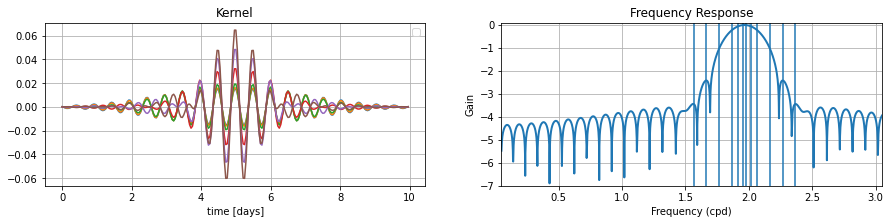

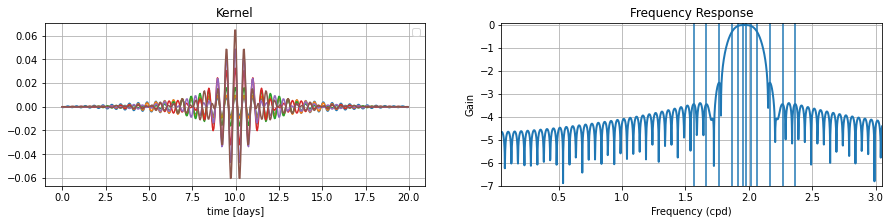

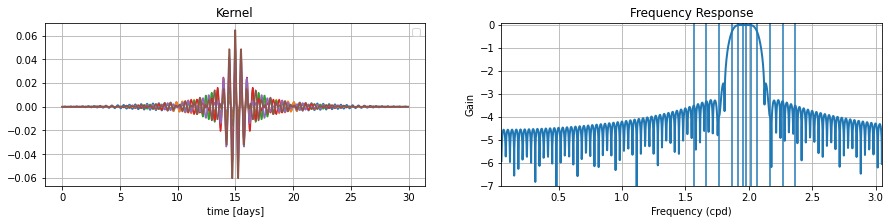

In [21]:
domega=0.2
for h in H.T_window:
    h_hat, w = sp.filter_response(H.sel(T_window=h,bandwidth=domega).dropna(dim='time'), dt=dt)
    fig, axes = plt.subplots(1,2, figsize=(15,3))
    ax = axes[0]
    #t = np.arange(0, h.size)*dt
    H.sel(T_window=h).plot(ax=ax,hue='bandwidth')
    ax.grid()
    ax.set_xlabel('time [days]')
    ax.set_title('Kernel')
    ax.legend()

    ax = axes[1]
    ax.plot(w, np.log10(abs(h_hat)), linewidth=2)
    for d in H.bandwidth:
        ax.axvline(omega-d/2)#, color='k')
        ax.axvline(omega+d/2)#, color='k')
    ax.set_xlabel('Frequency (cpd)')
    ax.set_ylabel('Gain')
    ax.set_title('Frequency Response')
    ax.set_ylim(-0.05, 1.05)
    ax.set_ylim(-7, 0.1)
    ax.set_xlim(0.05, 3.05)
    ax.grid(True)
    #H.plot.line(hue='T_window')

In [16]:
ds_hat={}
for v in ['zonal_velocity','meridional_velocity','Eta']:
    ds_hat[v+'_hat'] = xr.combine_nested([[filt(dsp[v], H.sel(T_window=h,bandwidth=dband).dropna(dim='time'),hilbert=True) for h in H.T_window]for dband in H.bandwidth]
                                 ,concat_dim=['bandwidth','T_window']).persist()
    ds_hat[v+'_hat'] = ds_hat[v+'_hat'].assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths]})

In [17]:
time = np.arange(0,ds['time'].values.size*dt,dt)
exp = np.exp(-1j*omega*2*np.pi*time)
for v in ['zonal_velocity','meridional_velocity','Eta']:
    ds_hat[v+'_hat'] = ds_hat[v+'_hat'].assign_coords({'lon':ds_hat[v+'_hat'].lon,'lat':ds_hat[v+'_hat'].lat})
    ds_hat[v+'_demodulated'] = ds_hat[v+'_hat']*exp

ds_hat = xr.merge([ds_hat[v].rename(v) for v in ds_hat.keys()])

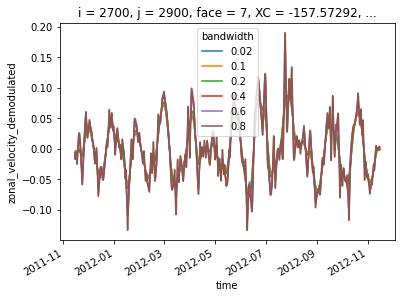

In [18]:
np.real(ds_hat['zonal_velocity_demodulated'].sel(T_window=10).isel(i=0,j=0)).plot(hue='bandwidth')

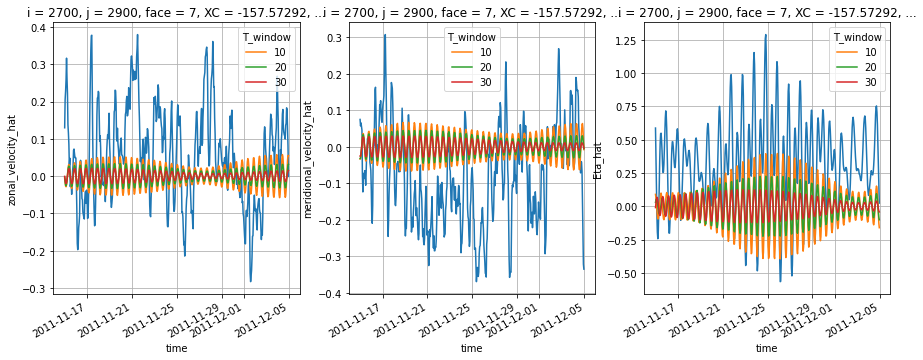

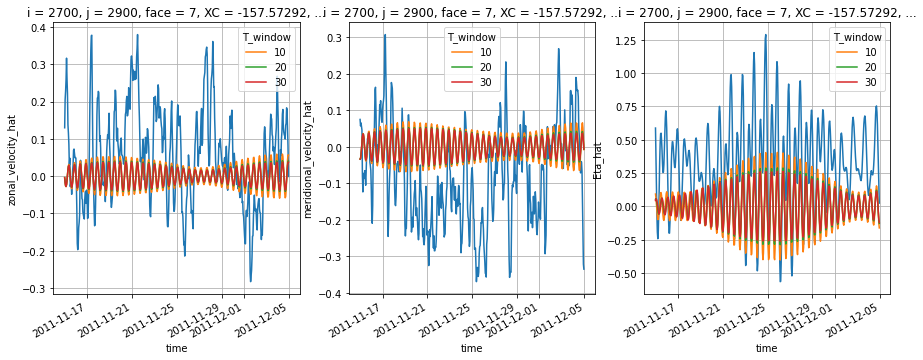

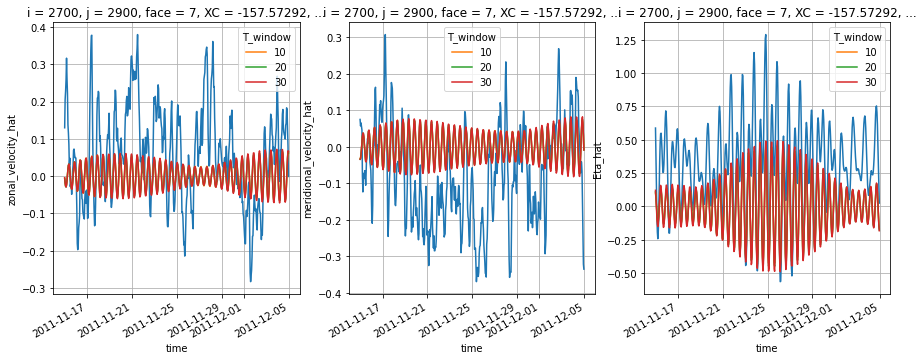

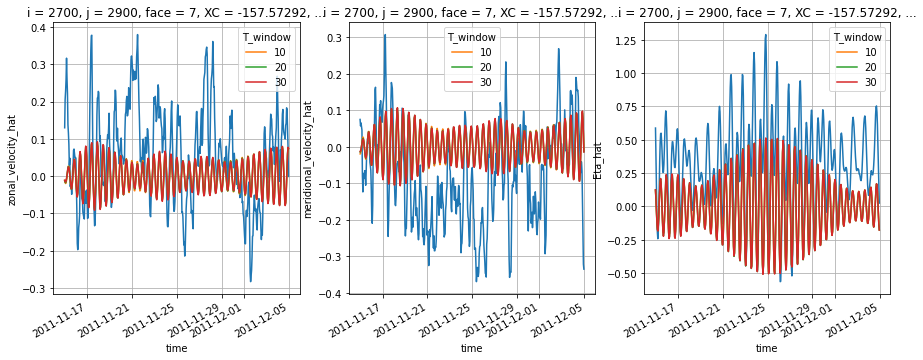

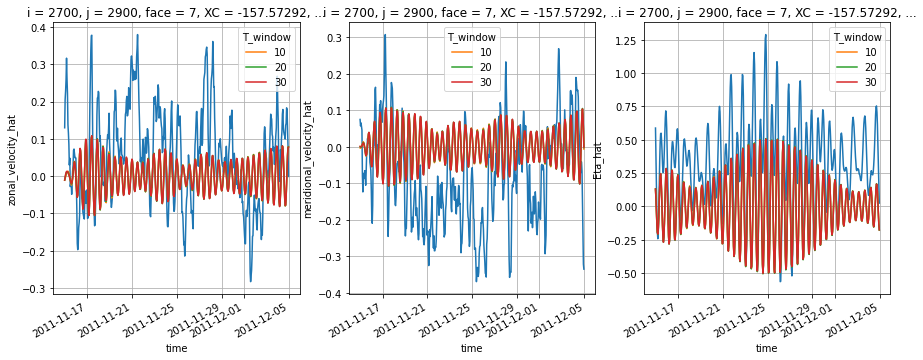

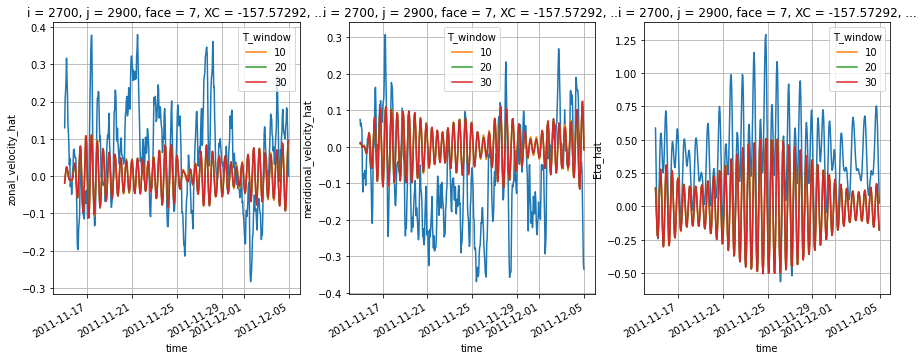

In [19]:
for dband in H.bandwidth:
    fig,axs = plt.subplots(1,3,figsize=(15,5))
    for v,ax in zip(['zonal_velocity','meridional_velocity','Eta'],axs):
        dsp[v].isel(i=0,j=0).isel(time=slice(0,20*24)).plot(ax=ax)
        np.real(ds_hat[v+'_hat']).isel(time=slice(0,20*24)).isel(i=0,j=0).sel(bandwidth=dband).plot(ax=ax,hue='T_window')
        ax.grid()

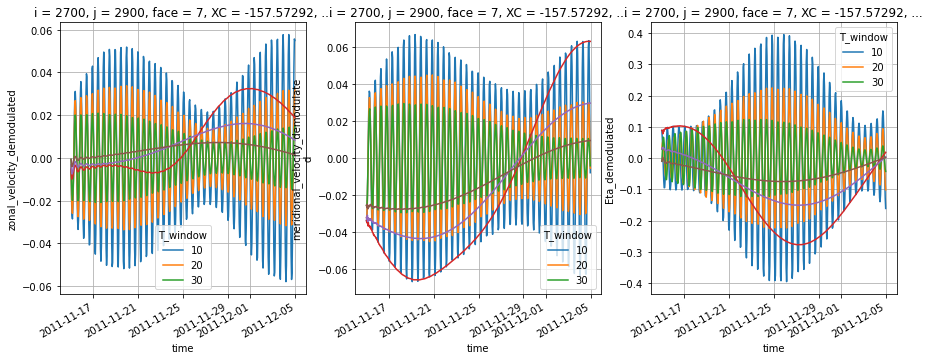

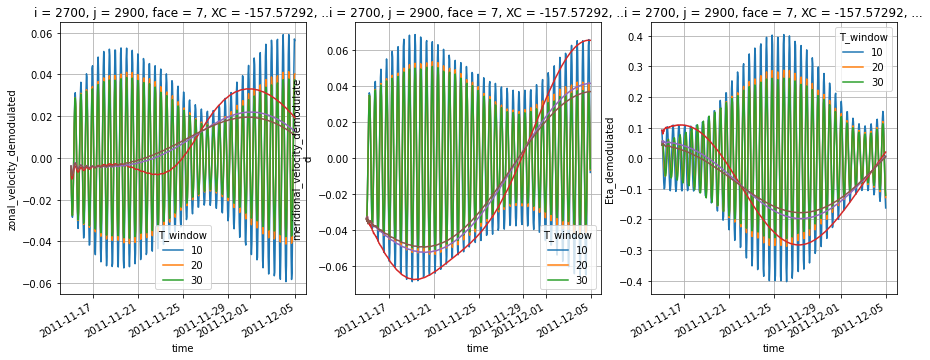

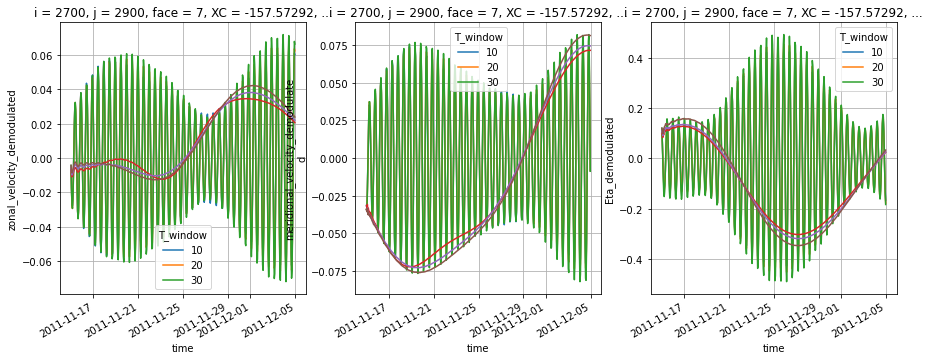

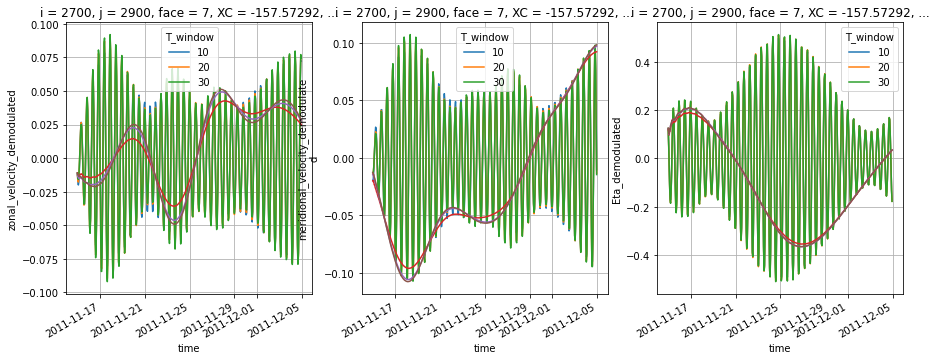

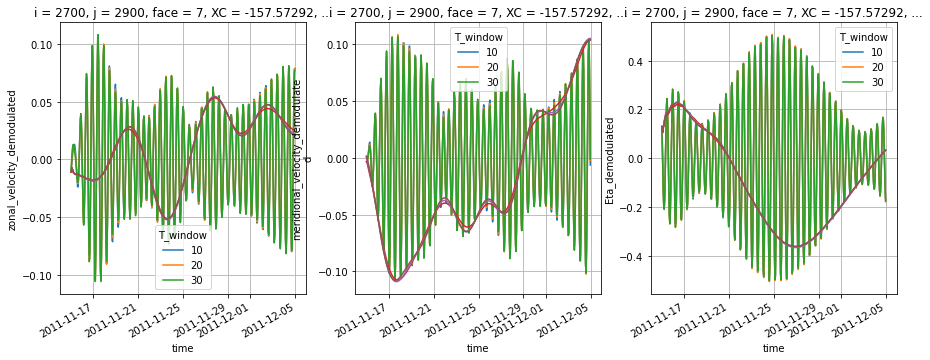

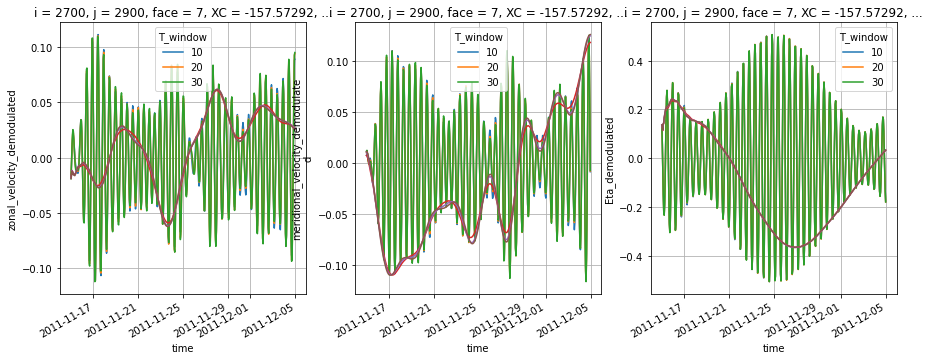

In [20]:

for dband in H.bandwidth:
    fig,axs = plt.subplots(1,3,figsize=(15,5))
    for v,ax in zip(['zonal_velocity','meridional_velocity','Eta'],axs):
        #dsp[v].isel(i=0,j=0).isel(time=slice(0,20*24)).plot(ax=ax)
        np.real(ds_hat[v+'_hat']).isel(time=slice(0,20*24)).isel(i=0,j=0).sel(bandwidth=dband).plot(ax=ax,hue='T_window')
        np.real(ds_hat[v+'_demodulated']).isel(time=slice(0,20*24)).isel(i=0,j=0).sel(bandwidth=dband).plot(ax=ax,hue='T_window',add_legend=False)
        ax.grid()

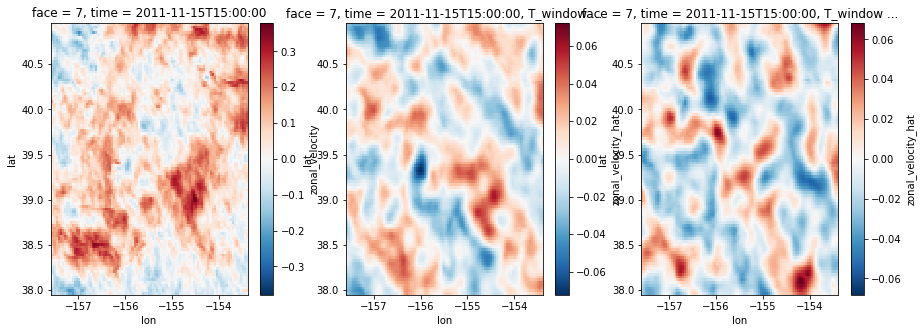

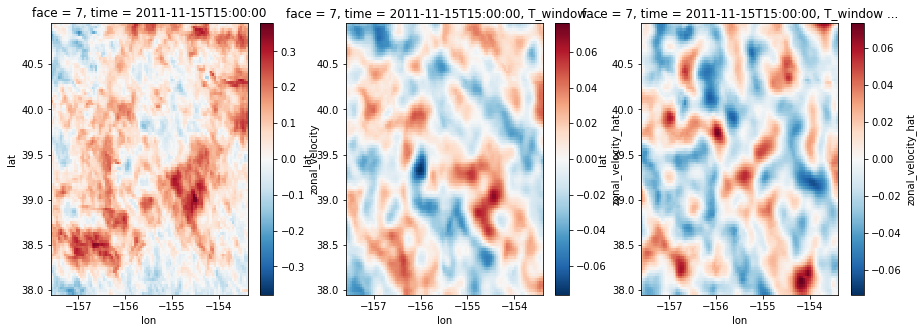

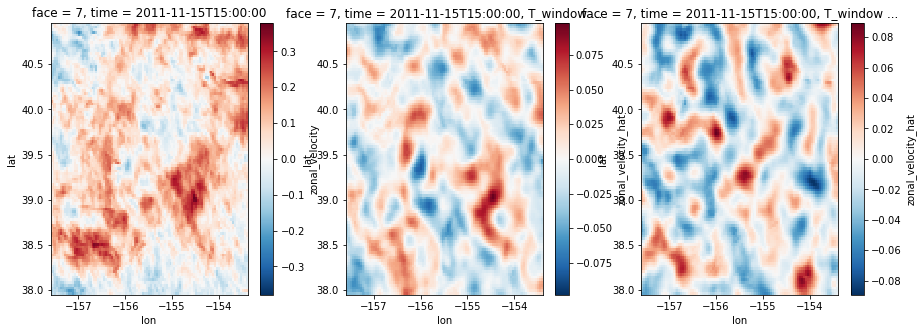

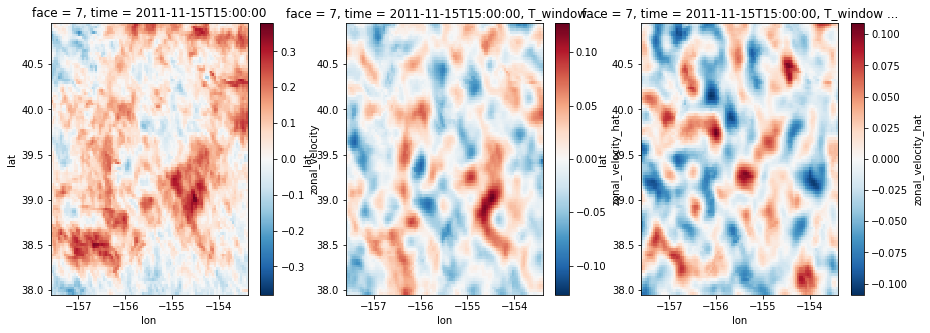

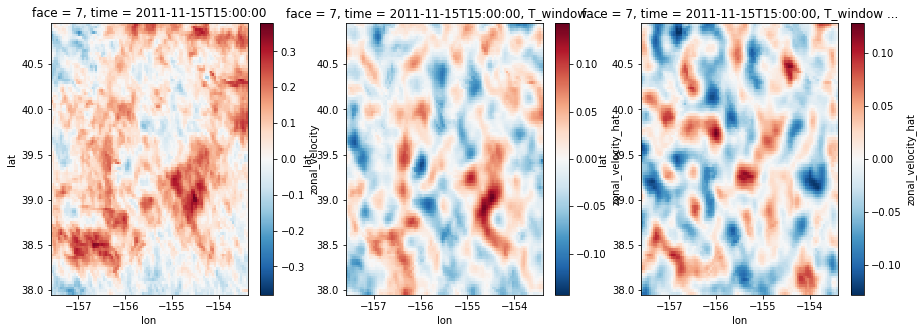

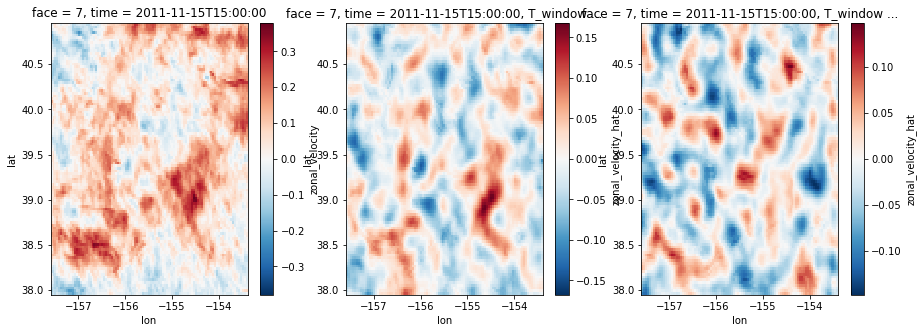

In [22]:
it = 15
v='zonal_velocity'
for dband in H.bandwidth:
    #for v in ['zonal_velocity','meridional_velocity']:
    fig,ax = plt.subplots(1,3,figsize=(15,5))
    np.real(ds_hat[v+'_hat']).isel(time=it,T_window=1).sel(bandwidth=dband).plot(ax=ax[1],x='lon',y='lat')
    np.imag(ds_hat[v+'_hat']).isel(time=it,T_window=1).sel(bandwidth=dband).plot(ax=ax[2],x='lon',y='lat')
    dsp[v].isel(time=it).plot(ax=ax[0],x='lon',y='lat')#,x='lon',y='lat'

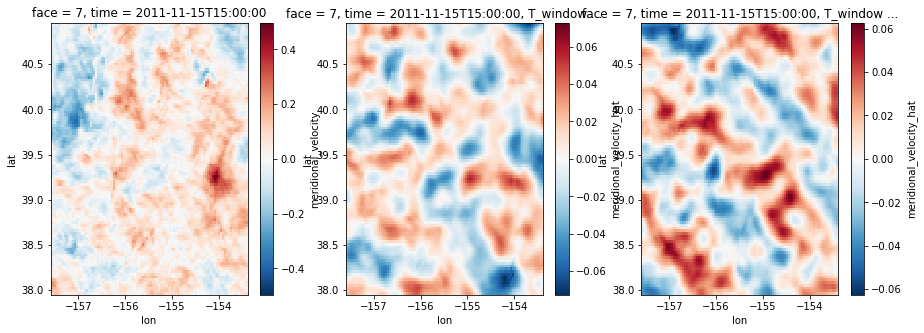

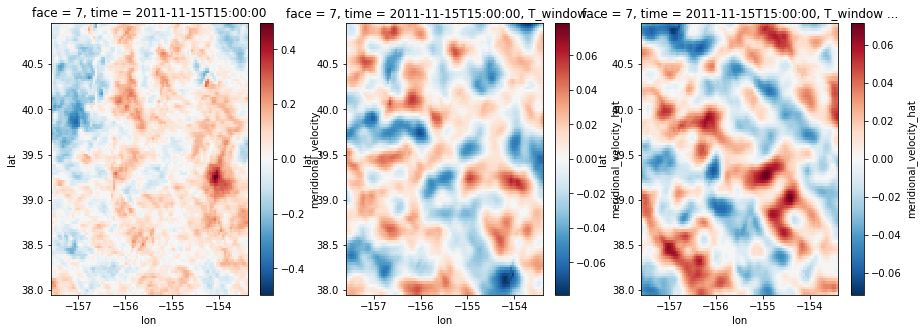

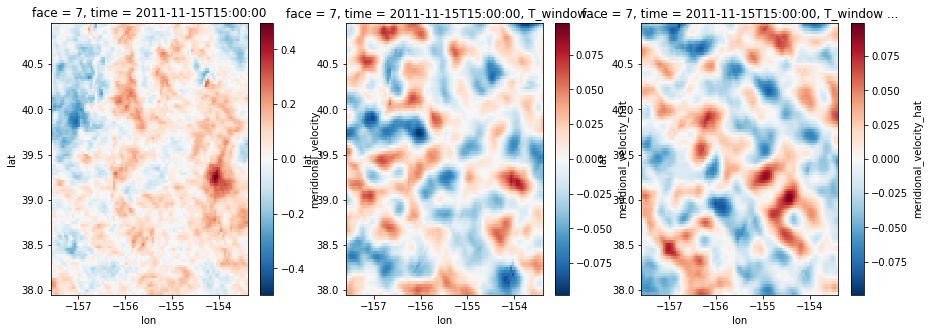

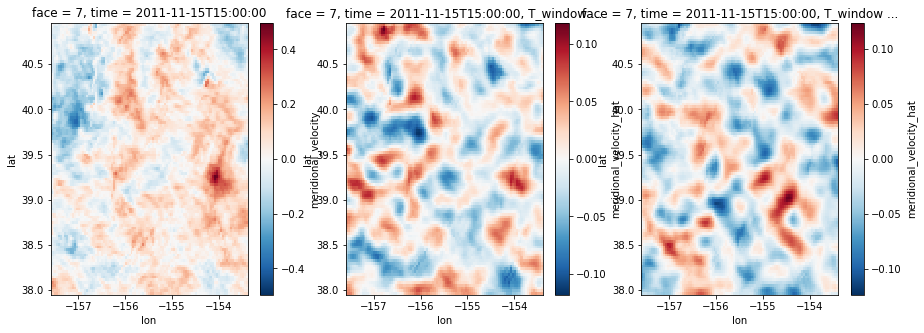

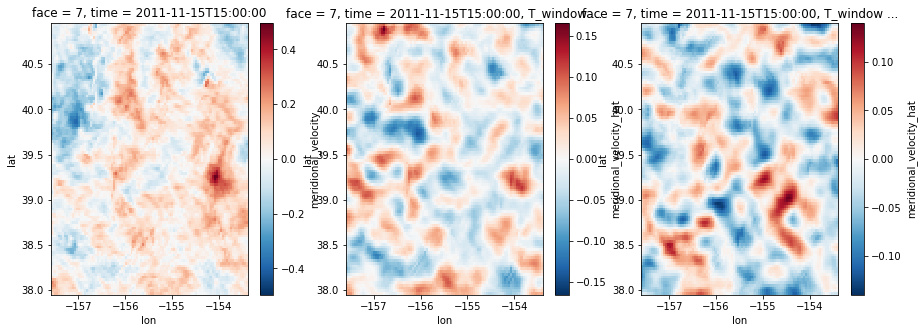

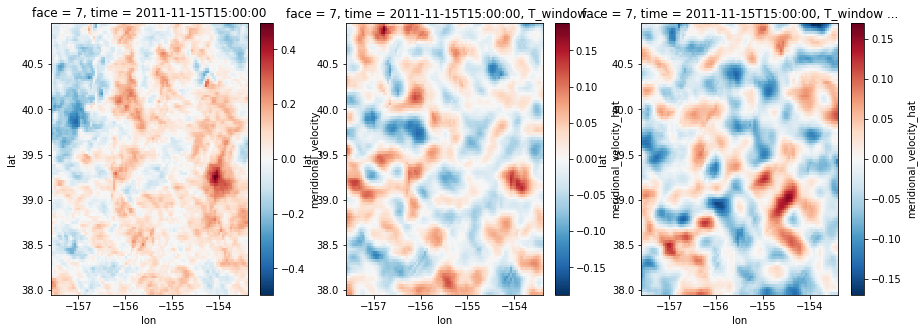

In [23]:
it = 15
v='meridional_velocity'
for dband in H.bandwidth:
    #for v in ['zonal_velocity','meridional_velocity']:
    fig,ax = plt.subplots(1,3,figsize=(15,5))
    np.real(ds_hat[v+'_hat']).isel(time=it,T_window=1).sel(bandwidth=dband).plot(ax=ax[1],x='lon',y='lat')
    np.imag(ds_hat[v+'_hat']).isel(time=it,T_window=1).sel(bandwidth=dband).plot(ax=ax[2],x='lon',y='lat')
    dsp[v].isel(time=it).plot(ax=ax[0],x='lon',y='lat')#,x='lon',y='lat'

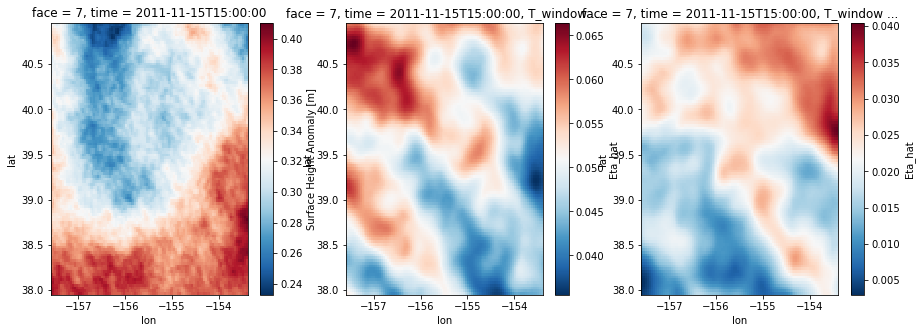

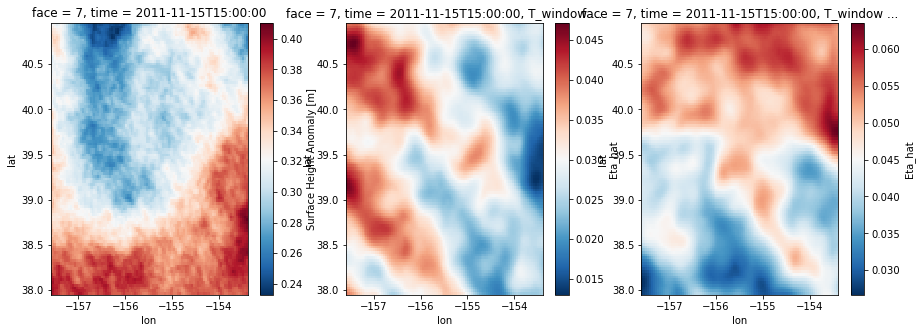

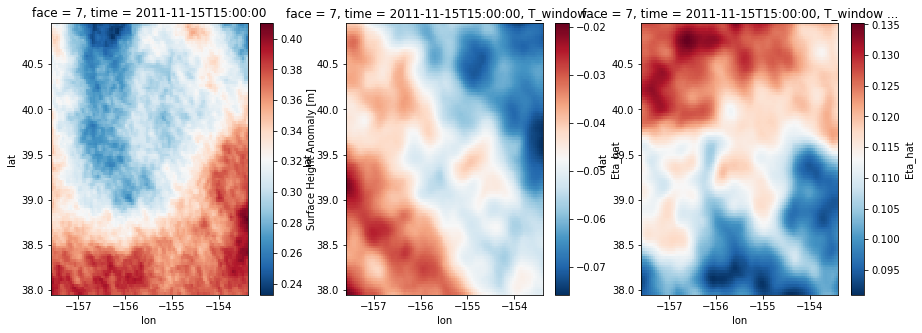

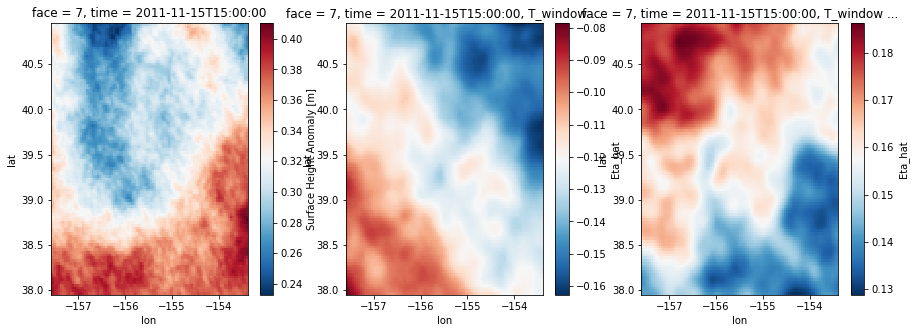

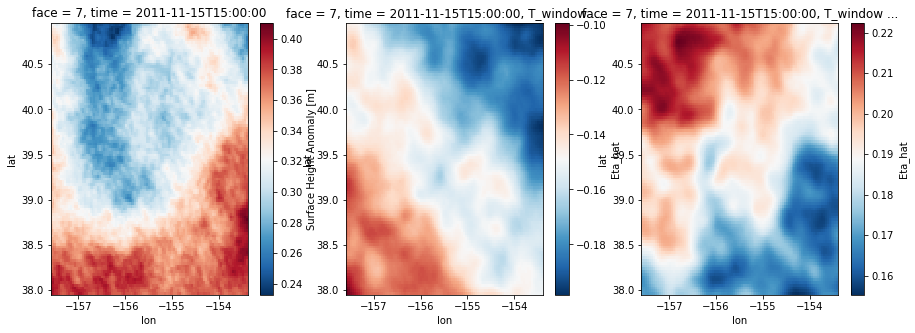

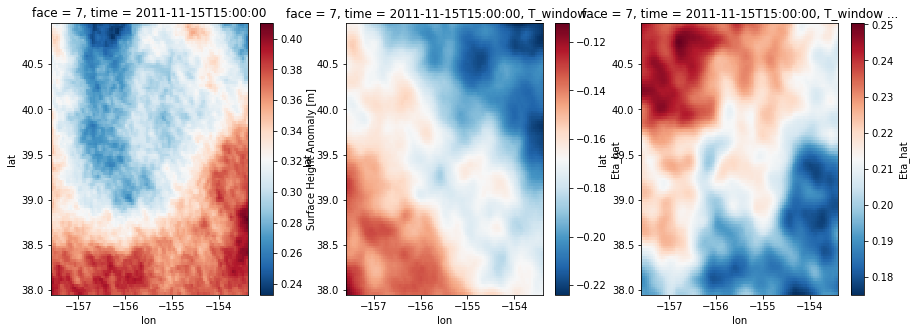

In [24]:
it = 15
v='Eta'
for dband in H.bandwidth:
    #for v in ['zonal_velocity','meridional_velocity']:
    fig,ax = plt.subplots(1,3,figsize=(15,5))
    np.real(ds_hat[v+'_hat']).isel(time=it,T_window=1).sel(bandwidth=dband).plot(ax=ax[1],x='lon',y='lat',cmap='RdBu_r')
    np.imag(ds_hat[v+'_hat']).isel(time=it,T_window=1).sel(bandwidth=dband).plot(ax=ax[2],x='lon',y='lat',cmap='RdBu_r')
    dsp[v].isel(time=it).plot(ax=ax[0],x='lon',y='lat',cmap='RdBu_r')#,x='lon',y='lat'

####Test cells

In [25]:
mean_tst = ds_hat['zonal_velocity_demodulated'].mean('time').sel(T_window=20,bandwidth=0.2).compute()
imag_tst = np.imag(ds_hat['zonal_velocity_demodulated']).mean('time').sel(T_window=20,bandwidth=0.2).compute()
real_tst = np.real(ds_hat['zonal_velocity_demodulated']).mean('time').sel(T_window=20,bandwidth=0.2).compute()

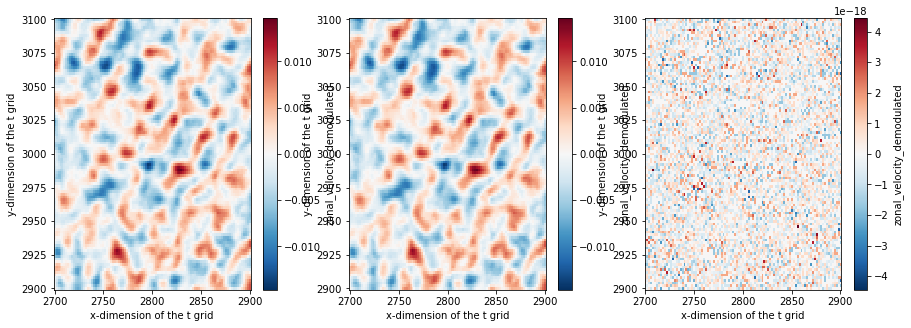

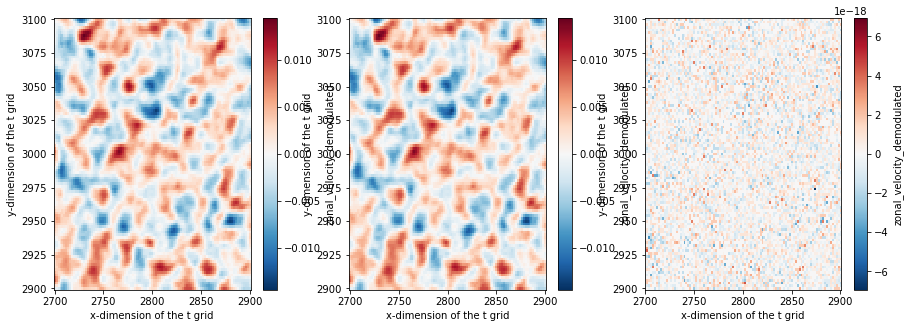

In [22]:
fig, axs = plt.subplots(1,3,figsize=(15,5))
np.real(mean_tst).plot(ax=axs[0])
real_tst.plot(ax=axs[1])
(np.real(mean_tst)-real_tst).plot(ax=axs[2])
for ax in axs:
    ax.set_title('')
    
fig, axs = plt.subplots(1,3,figsize=(15,5))
np.imag(mean_tst).plot(ax=axs[0])
imag_tst.plot(ax=axs[1])
(np.imag(mean_tst)-imag_tst).plot(ax=axs[2])
for ax in axs:
    ax.set_title('')

### Autocovariance

In [26]:
# Definition of the functions to compute the correlation
def correlate_E(v1, v2, dt=None, roll=False, detrend=True, ufunc=True,**kwargs):
    ''' Compute a lagged correlation between two time series
    These time series are assumed to be regularly sampled in time 
    and along the same time line.
    
    Parameters
    ----------
    
        v1, v2: ndarray, pd.Series
            Time series to correlate, the index must be time if dt is not provided
            
        dt: float, optional
            Time step
            
        detrend: boolean, optional
            Turns detrending on or off. Default is False.

    See: https://docs.scipy.org/doc/numpy/reference/generated/numpy.correlate.html
    '''
    
    assert v1.shape == v2.shape
    
    if not ufunc:
        v1 = v1.transpose((2,1,0))
        v2 = v2.transpose((2,1,0))
    
    if detrend and not roll:
        v1 = signal.detrend(v1)
        v2 = signal.detrend(v2)
        _correlate = np.correlate
        _kwargs = {'mode': 'valid'}
        N = int(v1.shape[-1]/2)
    else:
        _correlate = roll_correlate
        #if _ds1.dtype=='complex128':
        #    _kwargs = {'mode': 'full','detrend':detrend}
        #else:
        _kwargs = {'mode': 'valid','detrend':detrend}
    _kwargs.update(**kwargs)
    
    # loop over all dimensions but the last one to apply correlate
    Ni = v1.shape[:-1]
    # infer number of lags from dummy computation
    i0 = tuple(0 for i in Ni) + np.s_[:,]
    f = _correlate(v1[i0], v2[i0], **_kwargs)
    vv = np.full(Ni+f.shape, np.NaN)
    for ii in np.ndindex(Ni):
        f = _correlate(v1[ii + np.s_[:,]], v2[ii + np.s_[:,]], **_kwargs)
        Nj = f.shape
        for jj in np.ndindex(Nj):
            vv[ii + jj] = f[jj]
    
    # select only positive lags
    #vv = vv[...,:]
    
    if ufunc:
        return vv
    else:
        lags = np.arange(vv.shape[-1])*dt
        vv = vv.transpose((2,1,0))
        return lags, vv

def roll_correlate(v1, v2, Nr=None, overlap=0.5, detrend=True, **kwargs):
    ''' Correlation over temporal windows of size Nr with overlap
    '''
    i=0
    C=[]
    while i+Nr<v1.size:
        _v1 = v1[i:i+Nr]
        _v2 = v2[i:i+Nr]
        if detrend:
            _v1 = signal.detrend(_v1)
            _v2 = signal.detrend(_v2)
        C+=[np.correlate(_v1[Nr//2:], _v2, **kwargs)/(Nr/2)]
        i+=int((1-overlap)*Nr)
    return np.mean(np.stack(C), axis=0)
    
# quick tests
#v1 = ds.u.isel(x_u=slice(0,10), y_rho=slice(0,10)).values.transpose((1,2,0))
#v1_cor = correlate(v1, v1, dt=1/24/6)
#v1_cor = roll_correlate(v1[0,0,:], v1[0,0,:], Nr=6*24*20, overlap=0)
#v1_cor = correlate(v1, v1, roll=True, Nr=6*24*20, overlap=0)

In [27]:
# Wrapping function
def wrap_correlate(v1, v2, dt, lags=None, **kwargs):
    v1 = v1.chunk({'time': -1})
    v2 = v2.chunk({'time': -1})
    if lags is None:
        lags, C = correlate_E(v1.values, v2.values, dt=dt, ufunc=False, **kwargs)
        return lags, C
    else:
        #lags = np.arange(0,T//2+dt,dt)[:T//2*1/dt+1]
        if v1.dtype=='complex128':
            dtype=np.complex128
        else:
            dtype=np.float64
        C = xr.apply_ufunc(correlate_E, v1, v2,
                    dask='parallelized', output_dtypes=[dtype], #np.float64
                    input_core_dims=[['time'], ['time']],
                    output_core_dims=[['lags']],
                    dask_gufunc_kwargs={'output_sizes':{'lags': lags.size}}, kwargs=kwargs)
        return C.assign_coords(lags=lags).rename('correlation')

In [28]:
def correlate_nested(_ds1,_ds2,T_window, bandwidth,T, dt, mean='i',signals='total'):
    lags = np.arange(0,T//2+dt,dt)[:T//2*24+1]
    _u1 = _ds1.sel(T_window=T_window,bandwidth=bandwidth)
    _u2 = _ds2.sel(T_window=T_window,bandwidth=bandwidth)
    if signals=='demeaned':
        _u1=_u1-_u1.mean('time')
        _u2=_u2-_u2.mean('time')
    else:
        _u1=_u1
        _u2=_u2
    C = wrap_correlate(_u1, _u2, dt, lags=lags, roll=True,detrend=False, Nr=int(T/dt))#.persist()
    if mean:
        C_mean = C.mean(mean)#.compute()  
    else:
        C_mean=C
    #Cvv_mean.plot()
    return C_mean

### Comparison for one segment size for autocorrelation

$C_{raw}$ : autocovariance of the raw signal before filtering

$C_{hf}$ : autocovariance of the tidal signal after band pass filtering

In [29]:
T = 30 #time window size (size of th segments)
dt = 1/24#float((ds.time[1]-ds.time[0]).values) # time step


In [27]:
# Autocorrelation of v`
lags = np.arange(0,T//2+dt,dt)[:int(T//2*1/dt)+1]
_u = ds_hat['meridional_velocity_hat'].sel(T_window=20,bandwidth=0.2)

Chf = wrap_correlate(np.real(_u), np.real(_u),dt,lags=lags,roll=True,detrend=False, Nr=int(T/dt)).persist()

<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,


In [28]:
_u = dsp['meridional_velocity']
Craw = wrap_correlate(_u, _u,dt,lags=lags,roll=True,detrend=False, Nr=int(T/dt)).persist()


<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,


In [29]:
_u = ds_hat['meridional_velocity_demodulated']
Chf_demod = correlate_nested(np.real(_u),np.real(_u),20,0.2,T,dt,mean='',signals='demeaned').persist()


<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,


In [30]:
Chf_mean = Chf.mean(['i','j']).compute()
Chf_demod_mean = Chf_demod.mean(['i','j']).compute()
Craw_mean = Craw.mean(['i','j']).compute()

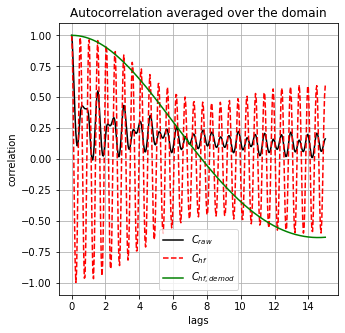

In [31]:
fig,ax = plt.subplots(figsize=(5,5))
(Craw_mean/Craw_mean.isel(lags=0)).plot(ax=ax,c='k',label=r'$C_{raw}$');
(Chf_mean/Chf_mean.isel(lags=0)).plot(ax=ax,linestyle='--',c='r',label=r'$C_{hf}$');
(Chf_demod_mean/Chf_demod_mean.isel(lags=0)).plot(ax=ax,linestyle='-',c='g',label=r'$C_{hf,demod}$');
ax.grid();ax.set_title('Autocorrelation averaged over the domain');
ax.legend()

### Autocovariance for several size of segments

In [30]:
for v in ['zonal_velocity','meridional_velocity','Eta']:
    ds_hat[v+'_demodulated_demean']=ds_hat[v+'_demodulated']-ds_hat[v+'_demodulated'].mean('time')

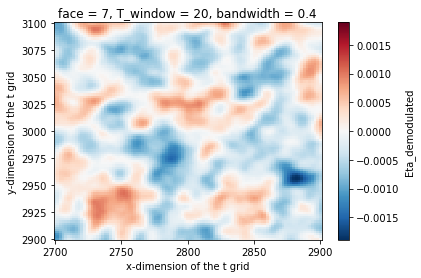

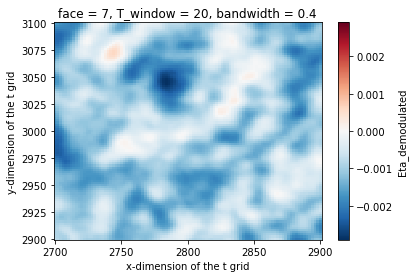

In [24]:
np.real(ds_hat[v+'_demodulated'].mean('time')).sel(T_window=20,bandwidth=0.4).plot()
plt.figure()
np.imag(ds_hat[v+'_demodulated'].mean('time')).sel(T_window=20,bandwidth=0.4).plot()

In [31]:
Tlag=[40,80,160]
mean = 'i' #['i','j']
v = 'meridional_velocity'

_ds1 = np.real(ds_hat[v+'_demodulated'])
_ds2 = np.real(ds_hat[v+'_demodulated'])
Crr = xr.combine_nested([[[correlate_nested(_ds1,_ds2,T_w,dband*2,T,dt,mean=mean,signals='demeaned') for T_w in T_window
                        ] for dband in bandwidths] for T in Tlag],concat_dim=['Tlag','bandwidth','T_window']).compute()

Crr = Crr.assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths],'Tlag':Tlag})
Crr

<xarray.DataArray 'correlation' (T_window: 3, bandwidth: 6, Tlag: 3, j: 101, lags: 1921)>
array([[[[[ 2.58077485e-03,  2.58067166e-03,  2.58036659e-03, ...,
                       nan,             nan,             nan],
          [ 2.58746200e-03,  2.58737853e-03,  2.58709325e-03, ...,
                       nan,             nan,             nan],
          [ 2.56195987e-03,  2.56190380e-03,  2.56164756e-03, ...,
                       nan,             nan,             nan],
          ...,
          [ 1.59647347e-03,  1.59646975e-03,  1.59633991e-03, ...,
                       nan,             nan,             nan],
          [ 1.63836755e-03,  1.63837358e-03,  1.63825160e-03, ...,
                       nan,             nan,             nan],
          [ 1.68952403e-03,  1.68952733e-03,  1.68940034e-03, ...,
                       nan,             nan,             nan]],

         [[ 2.62635008e-03,  2.62632576e-03,  2.62609555e-03, ...,
                       nan,             nan,             nan],
          [ 2.63224902e-03,  2.63221905e-03,  2.63198355e-03, ...,
                       nan,             nan,             nan],
          [ 2.60219129e-03,  2.60216419e-03,  2.60193380e-03, ...,
                       nan,             nan,             nan],
...
          [ 2.91540434e-03,  2.91448260e-03,  2.91152411e-03, ...,
                       nan,             nan,             nan],
          [ 2.96040343e-03,  2.95947893e-03,  2.95649860e-03, ...,
                       nan,             nan,             nan],
          [ 3.01060779e-03,  3.00967729e-03,  3.00667947e-03, ...,
                       nan,             nan,             nan]],

         [[ 4.23456833e-03,  4.23338551e-03,  4.23006804e-03, ...,
           -6.90104857e-04, -6.71853156e-04, -6.53533411e-04],
          [ 4.29444680e-03,  4.29323280e-03,  4.28987564e-03, ...,
           -6.91939741e-04, -6.73280100e-04, -6.54559079e-04],
          [ 4.31293458e-03,  4.31170006e-03,  4.30832398e-03, ...,
           -6.75709264e-04, -6.57151231e-04, -6.38537687e-04],
          ...,
          [ 3.23844739e-03,  3.23736677e-03,  3.23427662e-03, ...,
           -3.33126435e-04, -3.23809868e-04, -3.14436335e-04],
          [ 3.26999486e-03,  3.26890999e-03,  3.26580820e-03, ...,
           -3.56498396e-04, -3.47471941e-04, -3.38369466e-04],
          [ 3.30860435e-03,  3.30752877e-03,  3.30444844e-03, ...,
           -3.76056997e-04, -3.67188087e-04, -3.58236731e-04]]]]])
Coordinates:
  * lags       (lags) float64 0.0 0.04167 0.08333 0.125 ... 79.92 79.96 80.0
  * j          (j) int64 2900 2902 2904 2906 2908 ... 3092 3094 3096 3098 3100
    face       int64 7
  * T_window   (T_window) int64 10 20 30
  * bandwidth  (bandwidth) float64 0.02 0.1 0.2 0.4 0.6 0.8
  * Tlag       (Tlag) int64 40 80 160

In [32]:
#Tlag=[20,30,40,80]
#mean = ['i','j']
#v = 'meridional_velocity'
lags = np.arange(0,T//2+dt,dt)[:int(T//2*1/dt)+1]


_ds1 = np.imag(ds_hat[v+'_demodulated'])
_ds2 = np.imag(ds_hat[v+'_demodulated'])
Cii = xr.combine_nested([[[correlate_nested(_ds1,_ds2,T_w,dband*2,T,dt,mean=mean,signals='demeaned') for T_w in T_window
                        ] for dband in bandwidths] for T in Tlag],concat_dim=['Tlag','bandwidth','T_window']).compute()

Cii = Cii.assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths],'Tlag':Tlag})


In [33]:
_ds1 = np.real(ds_hat[v+'_demodulated'])
_ds2 = np.imag(ds_hat[v+'_demodulated'])
Cri = xr.combine_nested([[[correlate_nested(_ds1,_ds2,T_w,dband*2,T,dt,mean=mean,signals='demeaned') for T_w in T_window
                        ] for dband in bandwidths] for T in Tlag],concat_dim=['Tlag','bandwidth','T_window']).compute()

Cri = Cri.assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths],'Tlag':Tlag})


In [34]:
_ds1 = np.imag(ds_hat[v+'_demodulated'])
_ds2 = np.real(ds_hat[v+'_demodulated'])
Cir = xr.combine_nested([[[correlate_nested(_ds1,_ds2,T_w,dband*2,T,dt,mean=mean,signals='demeaned') for T_w in T_window
                        ] for dband in bandwidths] for T in Tlag],concat_dim=['Tlag','bandwidth','T_window']).compute()

Cir = Cir.assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths],'Tlag':Tlag})


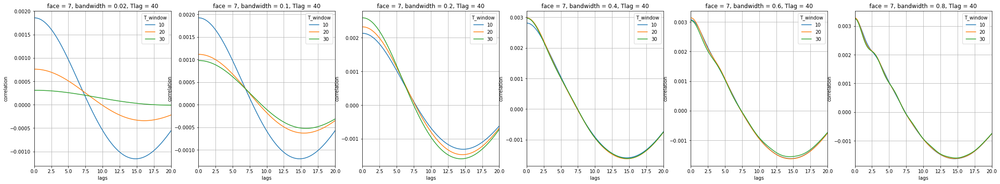

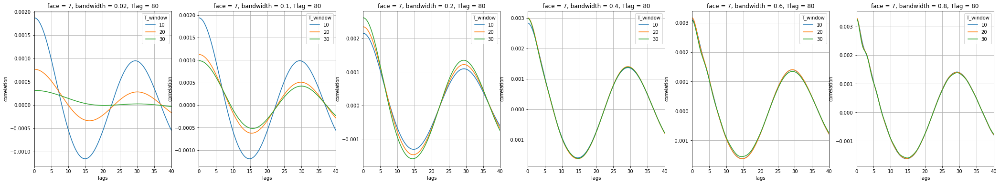

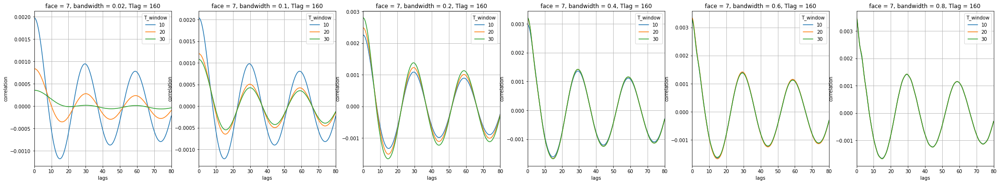

In [37]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Crr.bandwidth,axs):
            (Crr).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Crr.bandwidth,axs):
            (Crr.mean('j')).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_xlim(0,T//2)

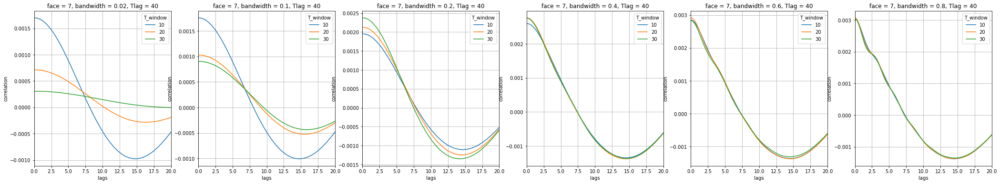

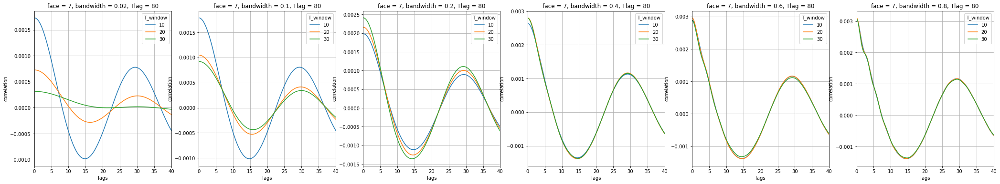

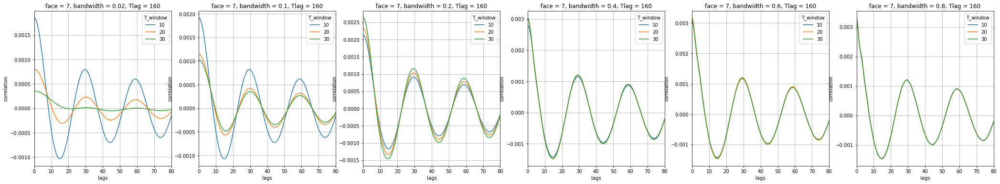

In [38]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cii).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else : 
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cii.mean('j')).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_xlim(0,T//2)

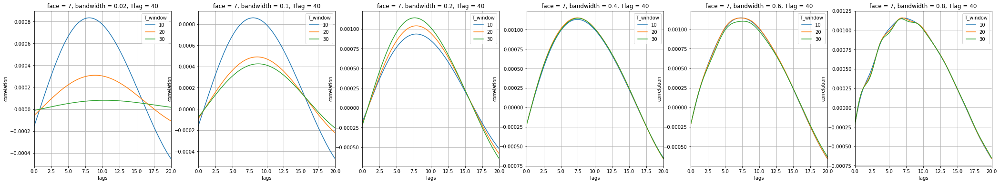

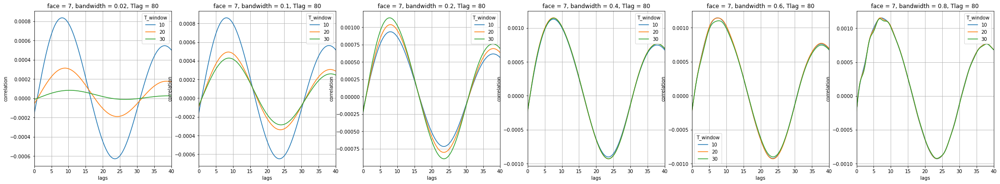

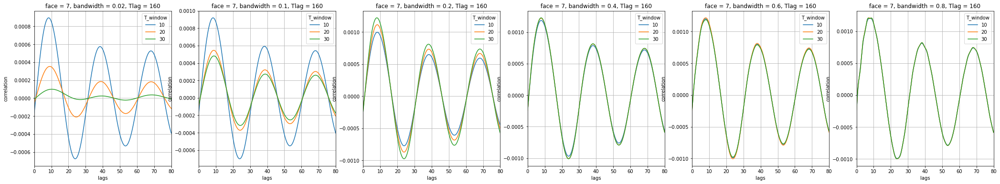

In [39]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cri).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else : 
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cri.mean('j')).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_xlim(0,T//2)

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: De

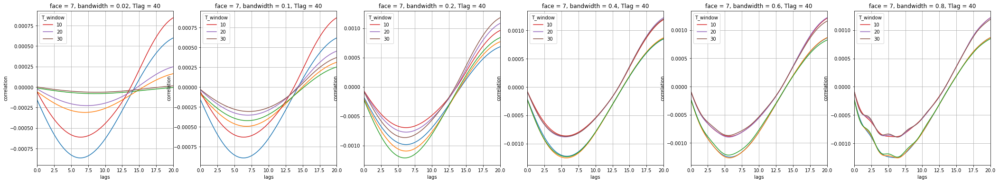

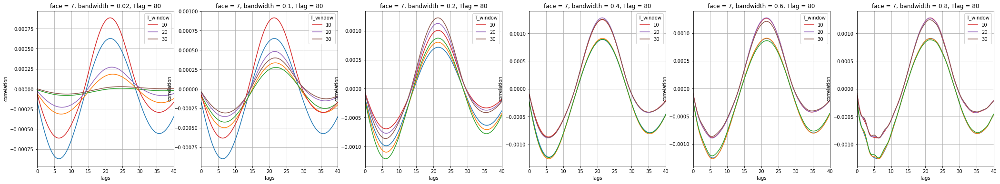

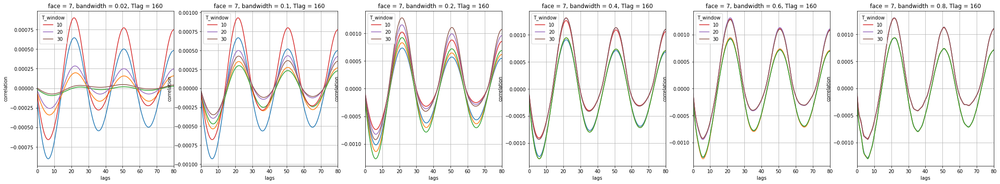

In [58]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cir).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else : 
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cir.mean('j')).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            (Cir.mean('j')+Cir.std('j')).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_xlim(0,T//2)

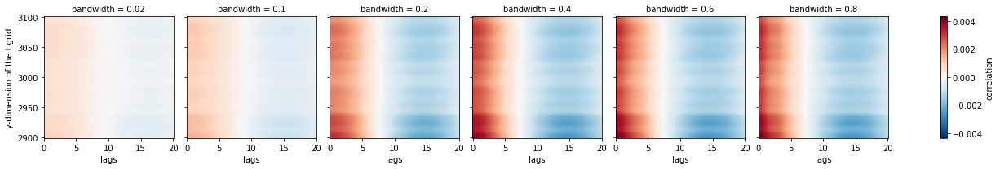

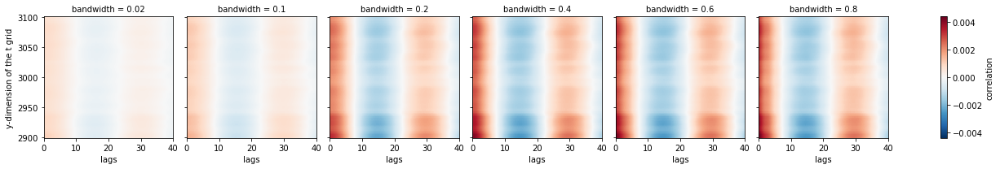

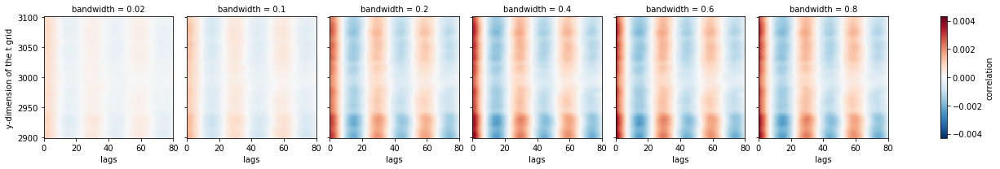

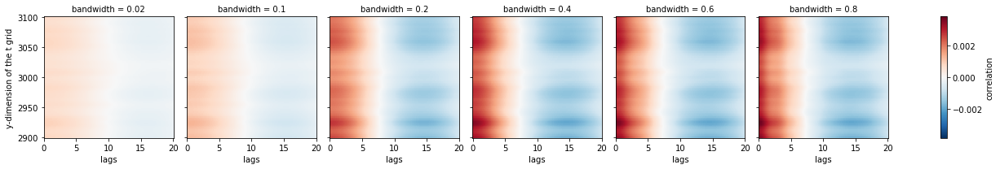

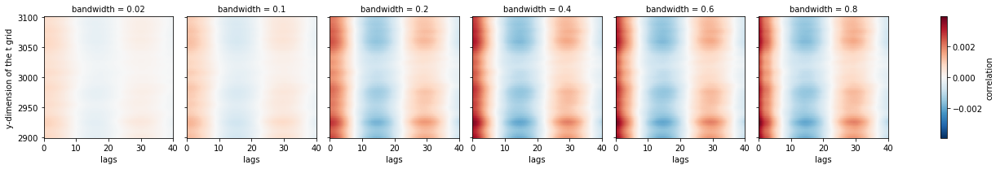

...

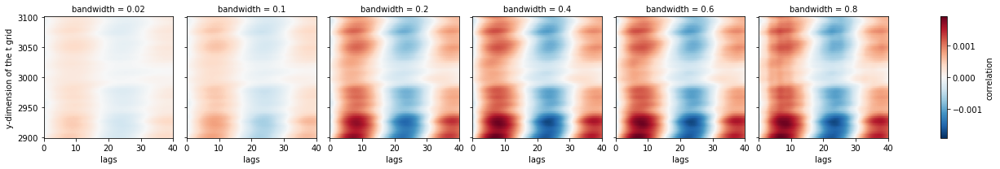

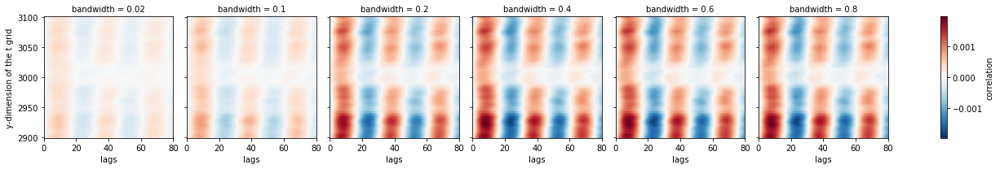

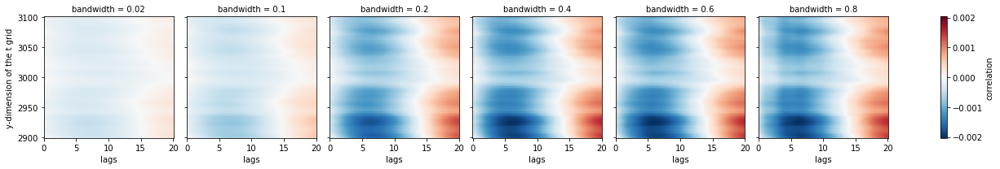

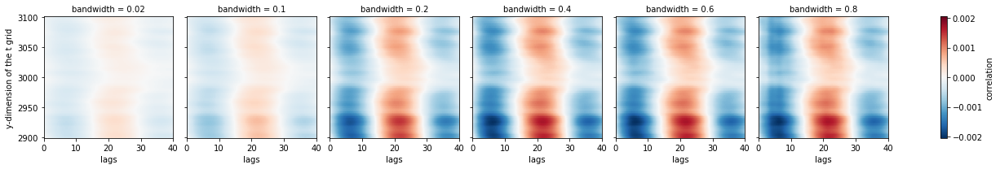

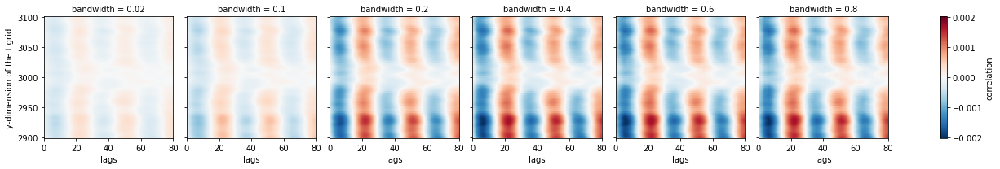

In [42]:
for T in Tlag:
    (Crr).sel(Tlag=T,T_window=20).dropna('lags').plot(col='bandwidth')
for T in Tlag:
    (Cii).sel(Tlag=T,T_window=20).dropna('lags').plot(col='bandwidth')
for T in Tlag:
    (Cri).sel(Tlag=T,T_window=20).dropna('lags').plot(col='bandwidth')
for T in Tlag:
    (Cir).sel(Tlag=T,T_window=20).dropna('lags').plot(col='bandwidth')

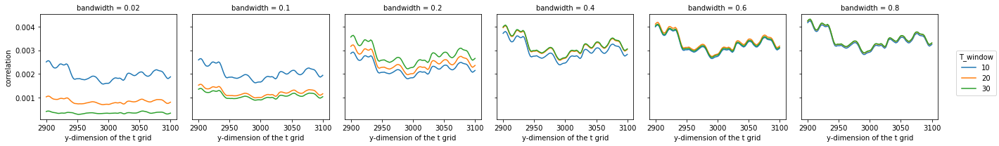

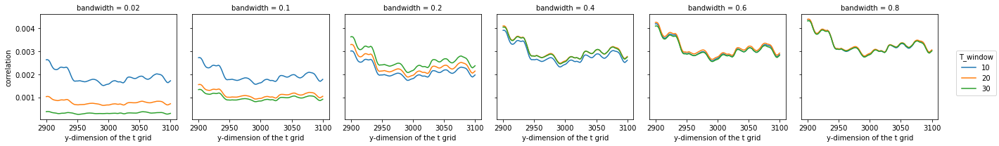

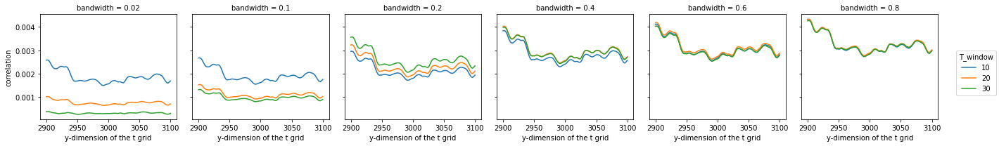

In [50]:
Crr.isel(lags=0).sel(Tlag=160).plot(hue='T_window',col='bandwidth')
Crr.isel(lags=0).sel(Tlag=80).plot(hue='T_window',col='bandwidth')
Crr.isel(lags=0).sel(Tlag=40).plot(hue='T_window',col='bandwidth')

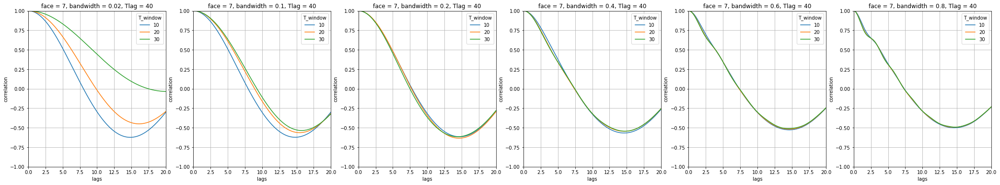

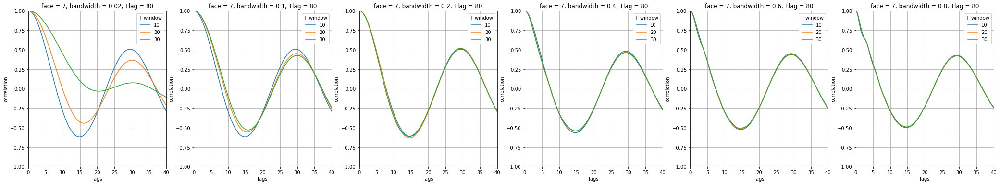

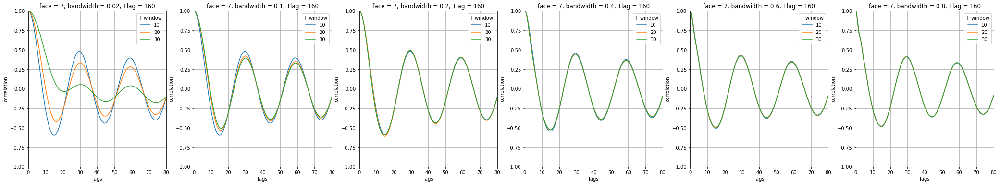

In [55]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Crr.bandwidth,axs):
            (Crr/Crr.isel(lags=0)).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Crr.bandwidth,axs):
            (Crr.mean('j')/Crr.isel(lags=0).mean('j')).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            
            #Crr.std('j').sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_ylim((-1,1));ax.set_xlim(0,T//2)

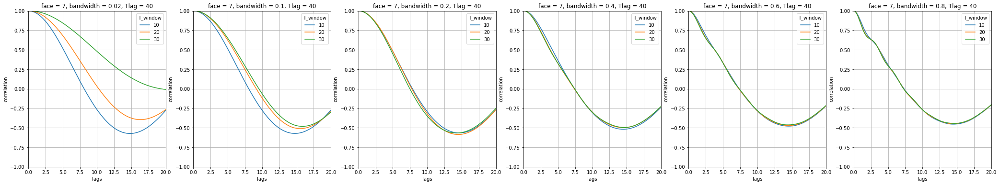

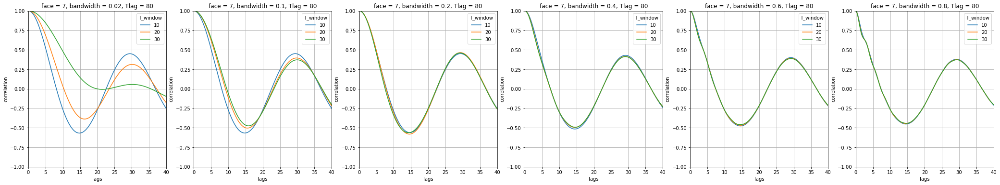

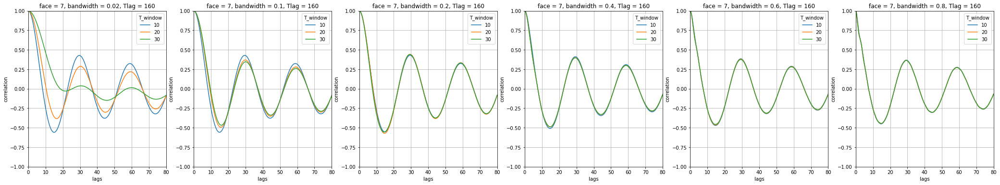

In [36]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cii/Cii.isel(lags=0)).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else : 
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cii.bandwidth,axs):
            (Cii.mean('j')/Cii.isel(lags=0).mean('j')).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_ylim((-1,1));ax.set_xlim(0,T//2)

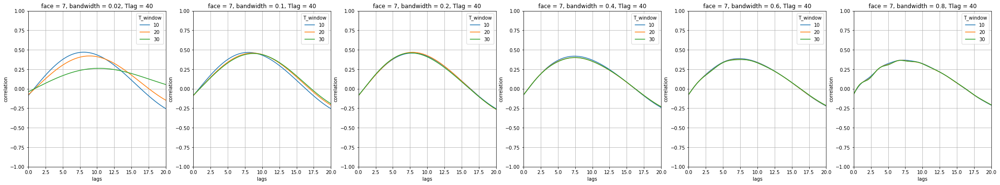

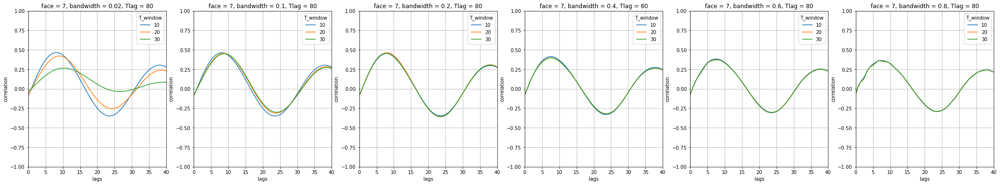

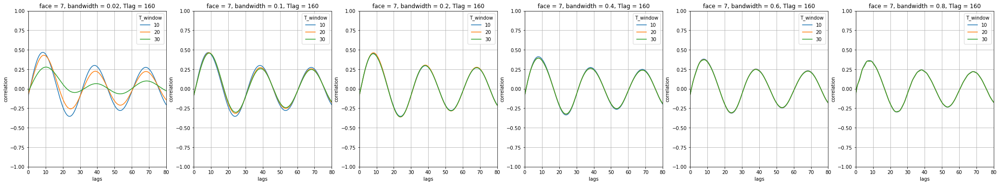

In [37]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cri.bandwidth,axs):
            (Cri/np.sqrt(Crr.isel(lags=0)*Cii.isel(lags=0))).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else :           
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cri.bandwidth,axs):
            (Cri.mean('j')/np.sqrt(Crr.isel(lags=0).mean('j')*Cii.isel(lags=0).mean('j'))).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_ylim((-1,1));ax.set_xlim(0,T//2)

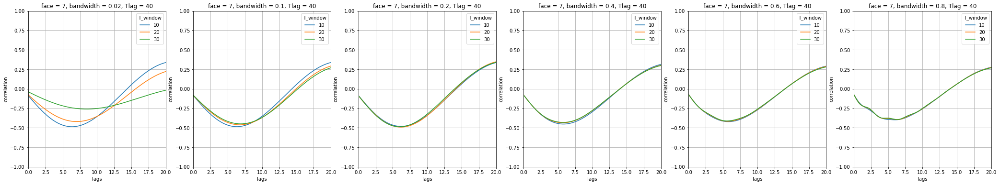

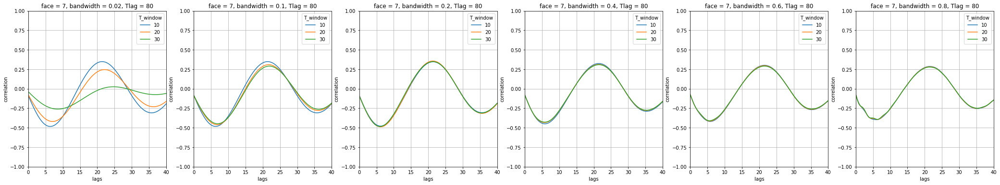

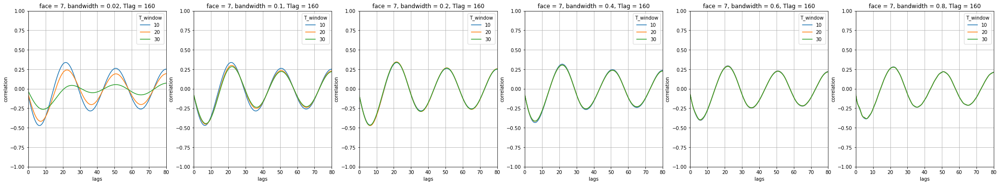

In [38]:
if mean==['i','j']:
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cir.bandwidth,axs):
            (Cir/np.sqrt(Crr.isel(lags=0)*Cii.isel(lags=0))).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid()
else :
    for T in Tlag:
        fig,axs = plt.subplots(1,len(bandwidths),figsize=(6*len(bandwidths),6))
        for dband,ax in zip(Cir.bandwidth,axs):
            (Cir.mean('j')/np.sqrt(Crr.isel(lags=0).mean('j')*Cii.isel(lags=0).mean('j'))).sel(bandwidth=dband,Tlag=T).plot(hue='T_window',ax=ax)
            ax.grid();ax.set_ylim((-1,1));ax.set_xlim(0,T//2)

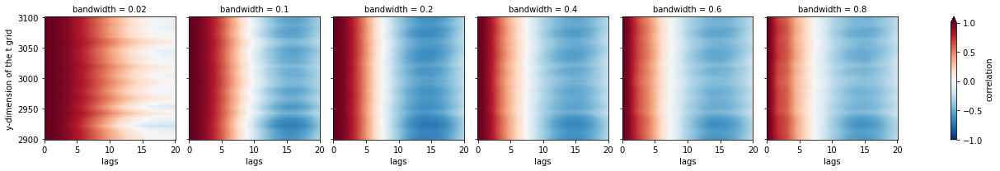

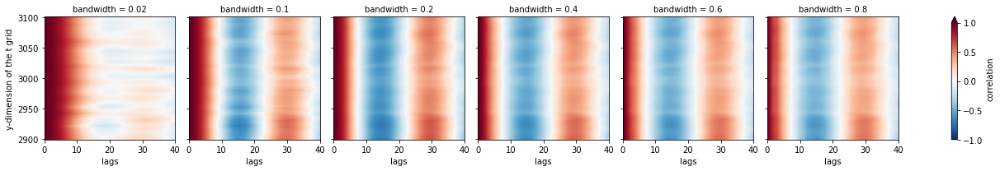

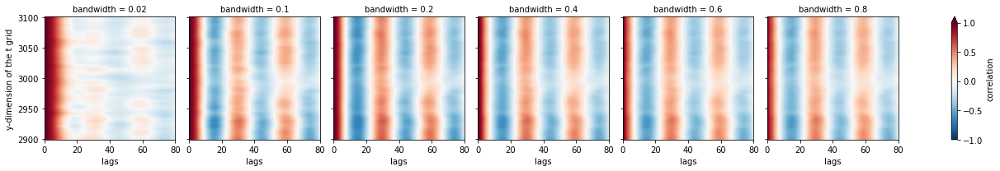

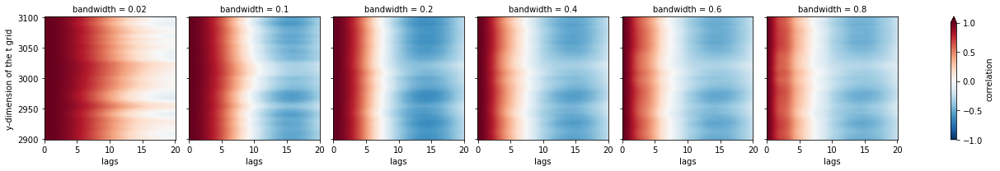

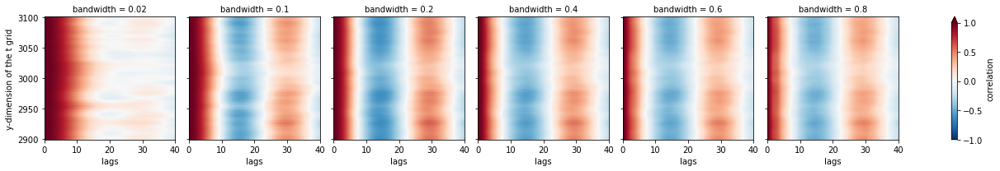

...

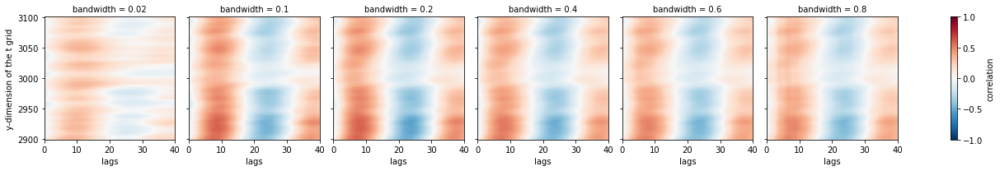

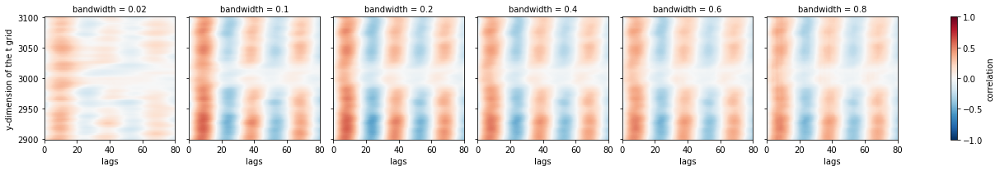

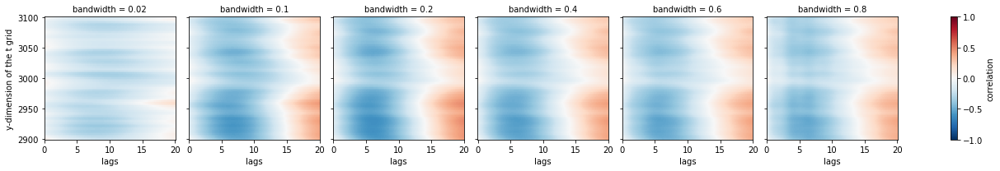

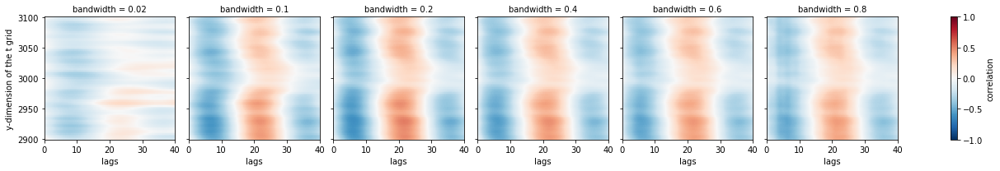

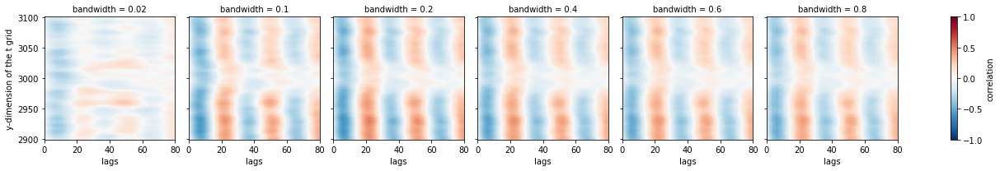

In [39]:
for T in Tlag:
    (Crr/Crr.isel(lags=0)).sel(Tlag=T,T_window=30).dropna('lags').plot(col='bandwidth',vmax=1)
for T in Tlag:
    (Cii/Cii.isel(lags=0)).sel(Tlag=T,T_window=30).dropna('lags').plot(col='bandwidth',vmax=1)
for T in Tlag:
    (Cri/np.sqrt(Crr.isel(lags=0)*Cii.isel(lags=0))).sel(Tlag=T,T_window=30).dropna('lags').plot(col='bandwidth',vmax=1)
for T in Tlag:
    (Cir/np.sqrt(Crr.isel(lags=0)*Cii.isel(lags=0))).sel(Tlag=T,T_window=30).dropna('lags').plot(col='bandwidth',vmax=1)

### Comparison for different variables : 
Based on what was seen for the merdional velocity, we look only the autocorrelation of the real part and cross correlation real imaginary part.

In [70]:
Tlag=[160]
bandwidths=[0.1,0.2]
T_window = [10,20]
mean = 'i' #['i','j']
V = ['zonal_velocity','meridional_velocity','Eta']
_ds = {}
for v in V:
    _ds1 = np.real(ds_hat[v+'_demodulated'])
    _ds2 = np.real(ds_hat[v+'_demodulated'])
    _ds[v+'_rr'] = xr.combine_nested([[[correlate_nested(_ds1,_ds2,T_w,dband*2,T,dt,mean=mean,signals='demeaned') for T_w in T_window
                            ] for dband in bandwidths] for T in Tlag],concat_dim=['Tlag','bandwidth','T_window']).compute()

    _ds[v+'_rr'] = _ds[v+'_rr'].assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths],'Tlag':Tlag}).rename(v+'_rr')
    
    _ds2 = np.imag(ds_hat[v+'_demodulated'])
    _ds[v+'_ri'] = xr.combine_nested([[[correlate_nested(_ds1,_ds2,T_w,dband*2,T,dt,mean=mean,signals='demeaned') for T_w in T_window
                            ] for dband in bandwidths] for T in Tlag],concat_dim=['Tlag','bandwidth','T_window']).compute()

    _ds[v+'_ri'] = _ds[v+'_ri'].assign_coords({'T_window':T_window,'bandwidth':[b*2 for b in bandwidths],'Tlag':Tlag}).rename(v+'_ri')

<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-24-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the `

In [71]:
_ds = xr.merge([_ds[v] for v in _ds.keys()])
_ds

<xarray.Dataset>
Dimensions:                 (T_window: 2, Tlag: 1, bandwidth: 2, j: 101, lags: 1921)
Coordinates:
  * j                       (j) int64 2900 2902 2904 2906 ... 3096 3098 3100
    face                    int64 7
  * T_window                (T_window) int64 10 20
  * bandwidth               (bandwidth) float64 0.2 0.4
  * lags                    (lags) float64 0.0 0.04167 0.08333 ... 79.96 80.0
  * Tlag                    (Tlag) int64 160
Data variables:
    zonal_velocity_rr       (T_window, bandwidth, Tlag, j, lags) float64 0.00...
    zonal_velocity_ri       (T_window, bandwidth, Tlag, j, lags) float64 -0.0...
    meridional_velocity_rr  (T_window, bandwidth, Tlag, j, lags) float64 0.00...
    meridional_velocity_ri  (T_window, bandwidth, Tlag, j, lags) float64 -2.2...
    Eta_rr                  (T_window, bandwidth, Tlag, j, lags) float64 0.04...
    Eta_ri                  (T_window, bandwidth, Tlag, j, lags) float64 0.03...

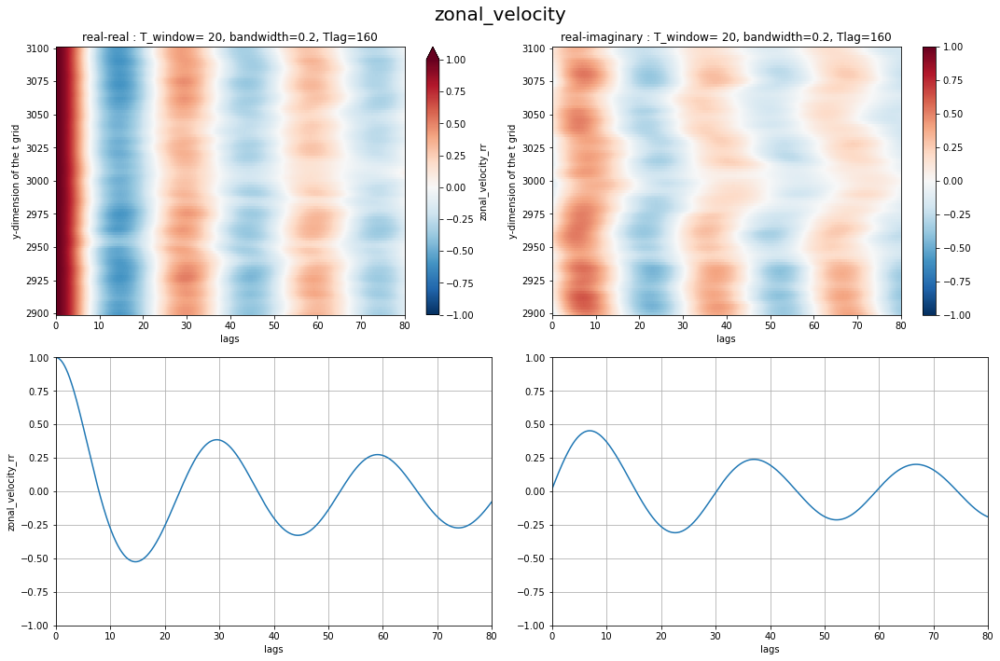

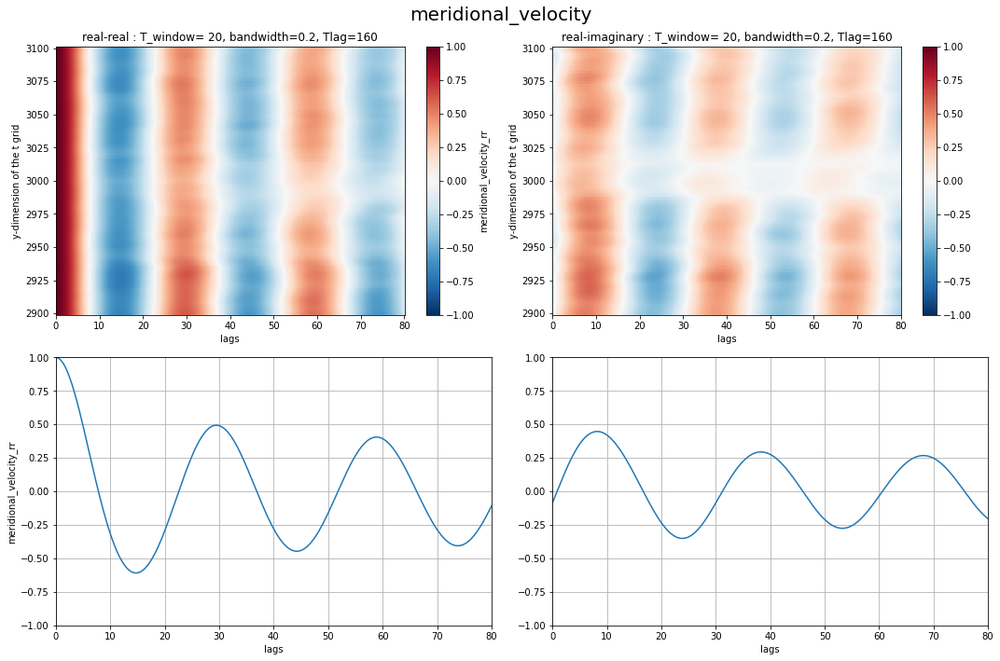

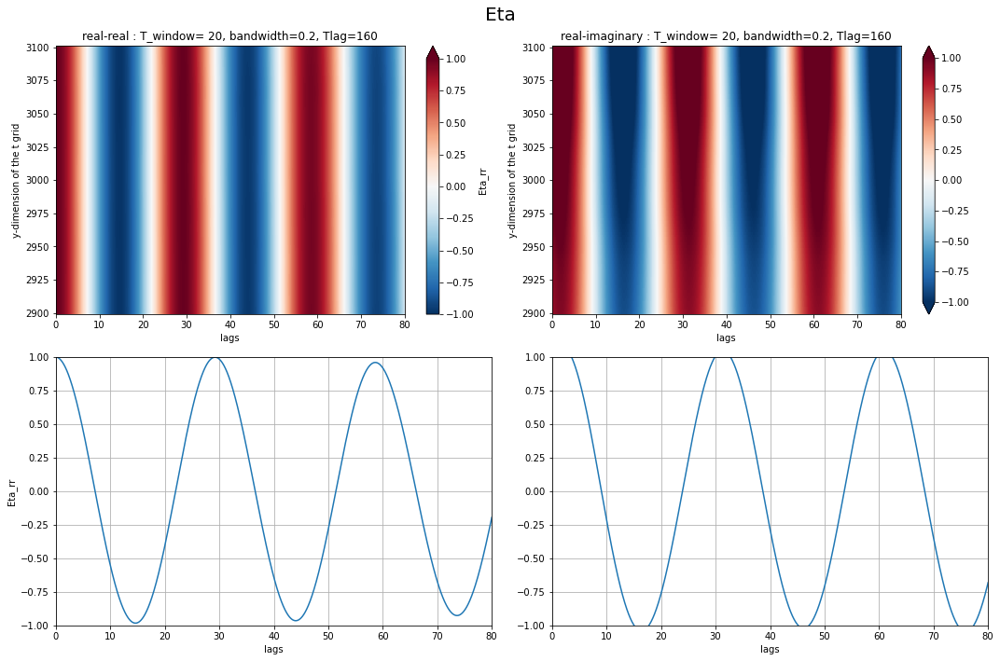

In [72]:
Tw = 20
dband = 0.2
Tl=160
for i,v in enumerate(V):
    fig,axs = plt.subplots(2,2,figsize=(15,10))
    (_ds[v+'_rr']/_ds[v+'_rr'].isel(lags=0)).sel(T_window=Tw,bandwidth=dband,Tlag=Tl).plot(ax=axs[0,0],vmax=1)
    (_ds[v+'_ri']/_ds[v+'_rr'].isel(lags=0)).sel(T_window=Tw,bandwidth=dband,Tlag=Tl).plot(ax=axs[0,1],vmax=1)
    axs[0,0].set_title(r'real-real : T_window= %s, bandwidth=%s, Tlag=%s'%(Tw,dband,Tl));
    axs[0,1].set_title(r'real-imaginary : T_window= %s, bandwidth=%s, Tlag=%s'%(Tw,dband,Tl));
    (_ds[v+'_rr'].mean('j')/_ds[v+'_rr'].isel(lags=0).mean('j')).sel(T_window=Tw,bandwidth=dband,Tlag=Tl).plot(ax=axs[1,0],ylim=(-1,1),xlim=(0,80))
    (_ds[v+'_ri'].mean('j')/_ds[v+'_rr'].isel(lags=0).mean('j')).sel(T_window=Tw,bandwidth=dband,Tlag=Tl).plot(ax=axs[1,1],ylim=(-1,1),xlim=(0,80))
    axs[1,0].grid();axs[1,1].grid();
    axs[1,0].set_title('');axs[1,1].set_title('');
    fig.suptitle(v,size=20)
    fig.tight_layout()

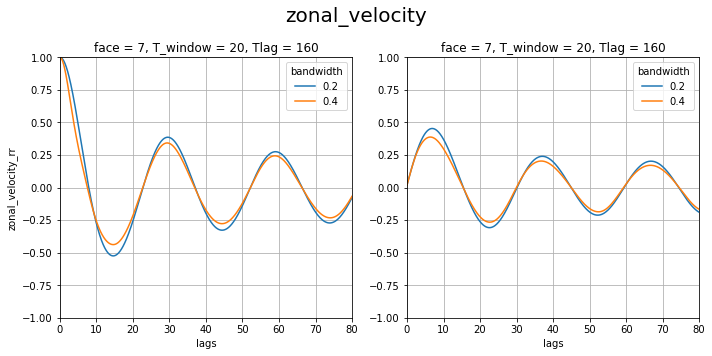

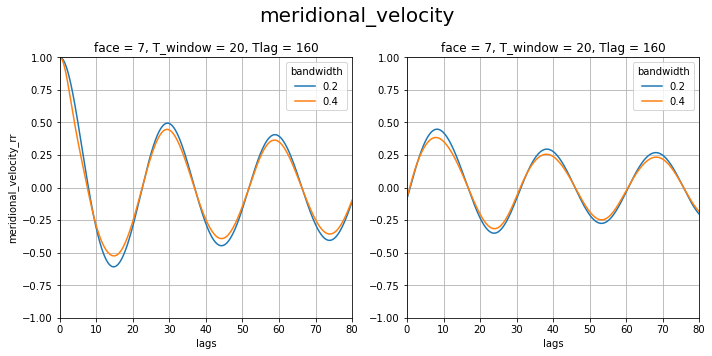

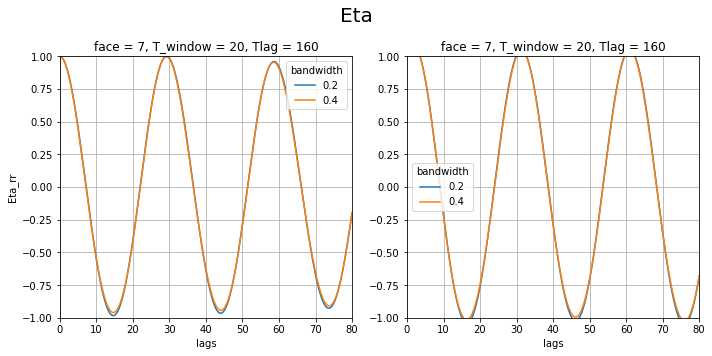

In [73]:
for i,v in enumerate(V):
    fig,axs = plt.subplots(1,2,figsize=(10,5))
    (_ds[v+'_rr'].mean('j')/_ds[v+'_rr'].isel(lags=0).mean('j')).sel(T_window=Tw,Tlag=Tl).plot(ax=axs[0],ylim=(-1,1),xlim=(0,80),hue='bandwidth')
    (_ds[v+'_ri'].mean('j')/_ds[v+'_rr'].isel(lags=0).mean('j')).sel(T_window=Tw,Tlag=Tl).plot(ax=axs[1],ylim=(-1,1),xlim=(0,80),hue='bandwidth')
    axs[0].grid();axs[1].grid();
#    axs[1,0].set_title('');axs[1,1].set_title('');
    fig.suptitle(v,size=20)
    fig.tight_layout()

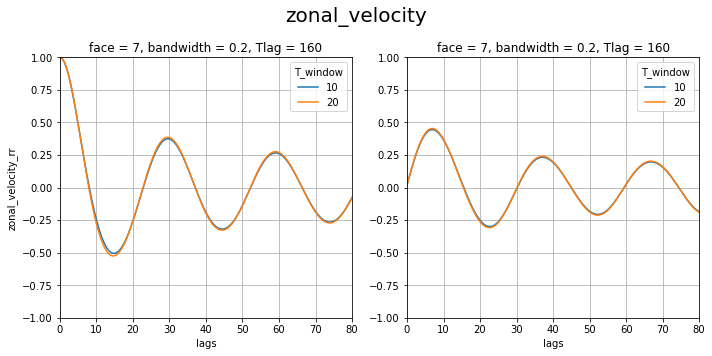

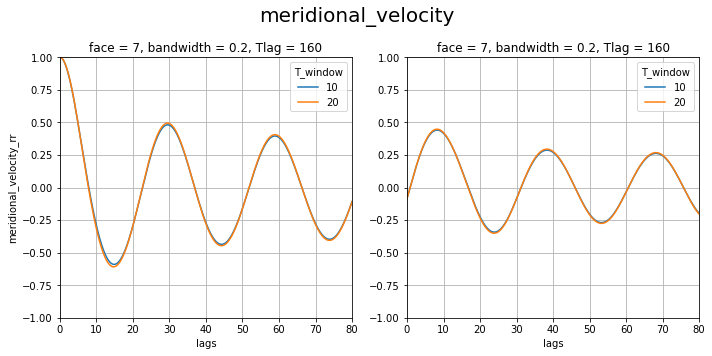

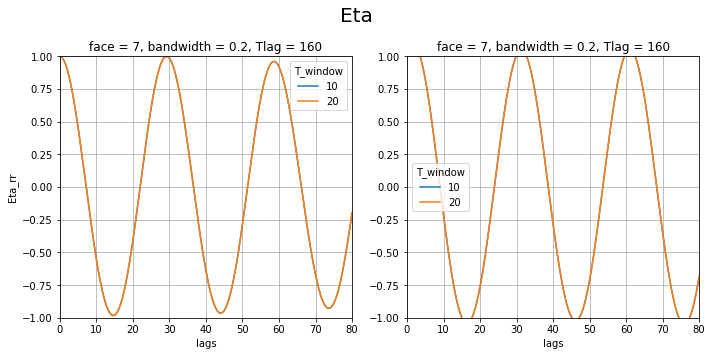

In [74]:
for i,v in enumerate(V):
    fig,axs = plt.subplots(1,2,figsize=(10,5))
    (_ds[v+'_rr'].mean('j')/_ds[v+'_rr'].isel(lags=0).mean('j')).sel(bandwidth=dband,Tlag=Tl).plot(ax=axs[0],ylim=(-1,1),xlim=(0,80),hue='T_window')
    (_ds[v+'_ri'].mean('j')/_ds[v+'_rr'].isel(lags=0).mean('j')).sel(bandwidth=dband,Tlag=Tl).plot(ax=axs[1],ylim=(-1,1),xlim=(0,80),hue='T_window')
    axs[0].grid();axs[1].grid();
#    axs[1,0].set_title('');axs[1,1].set_title('');
    fig.suptitle(v,size=20)
    fig.tight_layout()

### Slow motion : low pass filtering

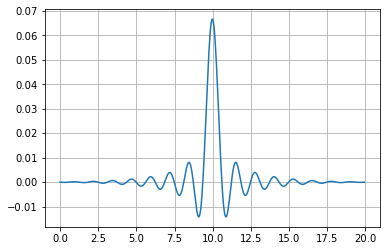

In [18]:
dt = 1. # in hours
T = 20
omega = 1/30
h = signal.firwin(T*24, cutoff=[omega], pass_zero=True, nyq=1./2/dt, scale=True)

ax = plt.subplot(111)
ax.plot(np.arange(0,T,dt/24),h)
ax.grid()


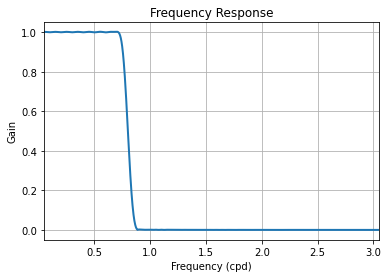

In [19]:
w, hh = signal.freqz(h, worN=8000)
plt.plot((w/np.pi)/2/dt*24, abs(hh), linewidth=2)
plt.xlabel('Frequency (cpd)')
plt.ylabel('Gain')
plt.title('Frequency Response')
plt.ylim(-0.05, 1.05)
plt.xlim(0.05, 3.05)
plt.grid(True)

In [29]:
V = ['zonal_velocity','meridional_velocity','Eta']
ds_hat = xr.merge([filt(dsp[v], h,hilbert=True).rename(v+'_hat') for v in V]).persist()

In [31]:
dt = 1/24
time = np.arange(0,ds['time'].values.size*dt,dt)
exp = np.exp(-1j*omega*2*np.pi*time)
for v in V:
    ds_hat[v+'_hat'] = ds_hat[v+'_hat'].assign_coords({'lon':ds_hat[v+'_hat'].lon,'lat':ds_hat[v+'_hat'].lat})
    ds_hat[v+'_demodulated'] = ds_hat[v+'_hat']*exp
    ds_hat[v+'_hat'] = ds_hat[v+'_hat']-ds_hat[v+'_hat'].mean('time')
    ds_hat[v+'_demodulated'] = ds_hat[v+'_demodulated']-ds_hat[v+'_demodulated'].mean('time')



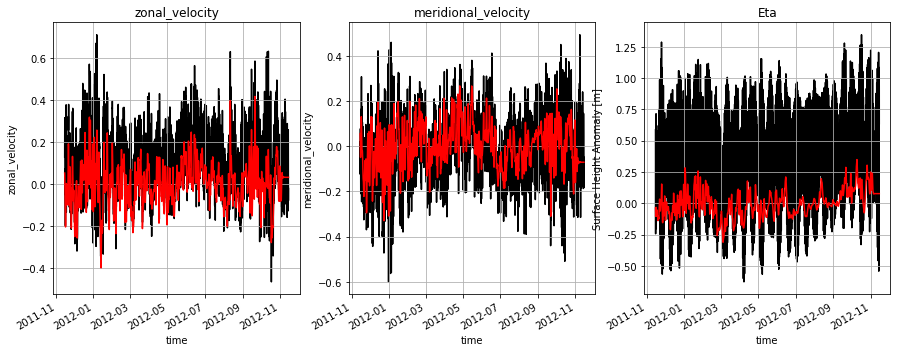

In [32]:
fig,ax = plt.subplots(1,len(V),figsize=(5*len(V),5))
for i,v in enumerate(V):
    np.real(ds_hat[v+'_hat'].isel(i=0,j=0)).plot(ax=ax[i],c='r')
    dsp[v].isel(i=0,j=0).plot(ax=ax[i],c='k',zorder=-1)
    ax[i].grid();ax[i].set_title(v)

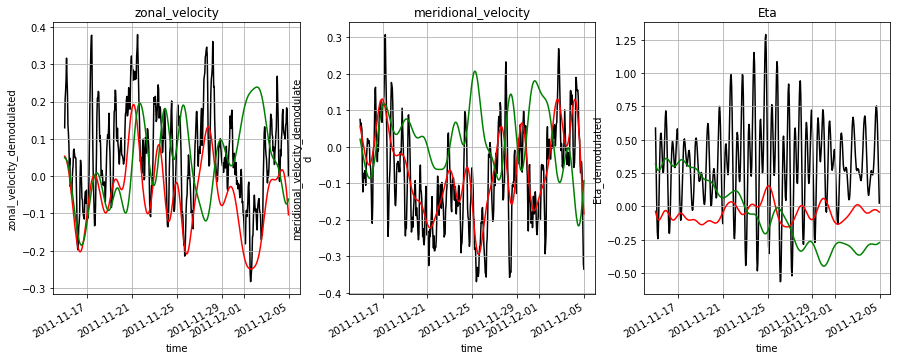

In [33]:
fig,ax = plt.subplots(1,len(V),figsize=(5*len(V),5))
for i,v in enumerate(V):
    np.real(ds_hat[v+'_hat'].isel(i=0,j=0,time=slice(0,24*20))).plot(ax=ax[i],c='r')
    dsp[v].isel(i=0,j=0,time=slice(0,24*20)).plot(ax=ax[i],c='k',zorder=-1)
    np.real(ds_hat[v+'_demodulated'].isel(i=0,j=0,time=slice(0,24*20))).plot(ax=ax[i],c='g')
    ax[i].grid();ax[i].set_title(v)


In [34]:
T = 30
lags = np.arange(0,T//2+dt,dt)[:int(T//2*1/dt)+1]
R={}
for v in V:
    _u = ds_hat[v+'_hat']
    Crr = wrap_correlate(np.real(_u), np.real(_u),dt,lags=lags,roll=True,detrend=False, Nr=int(T/dt)).persist()
    Cri = wrap_correlate(np.real(_u), np.imag(_u),dt,lags=lags,roll=True,detrend=False, Nr=int(T/dt)).persist()
    R[v] = xr.merge([Crr.rename(v+'_real-real'),Cri.rename(v+'_real-imag')])

<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the `

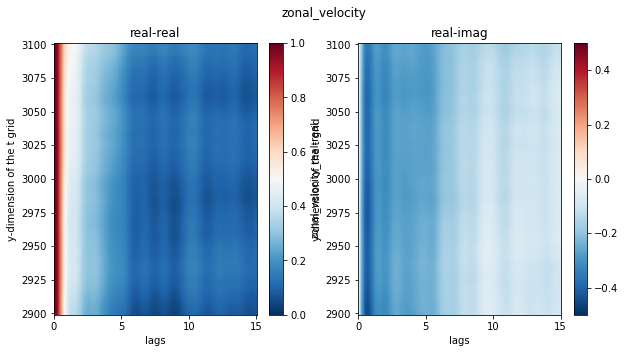

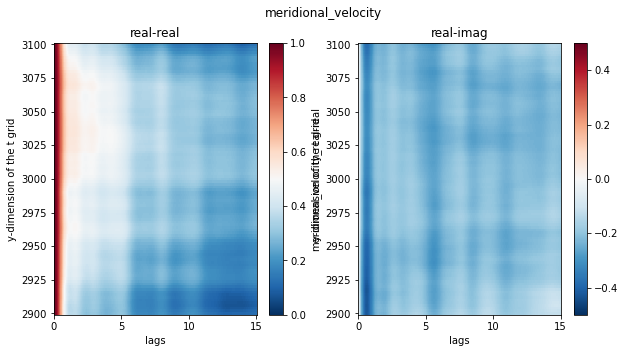

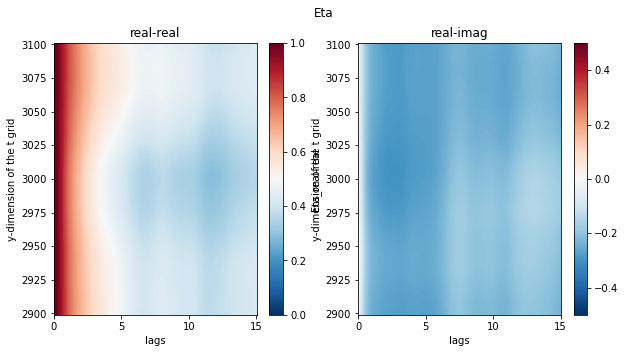

In [35]:
for v in V:
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    (R[v][v+'_real-real'].mean('i')/R[v][v+'_real-real'].mean('i').isel(lags=0)).plot(ax=ax[0],vmax=1,vmin=0,cmap='RdBu_r')
    (R[v][v+'_real-imag'].mean('i')/R[v][v+'_real-real'].mean('i').isel(lags=0)).plot(ax=ax[1],vmax=0.5,cmap='RdBu_r')
    ax[1].set_title('real-imag');ax[0].set_title('real-real')
    fig.suptitle(v)

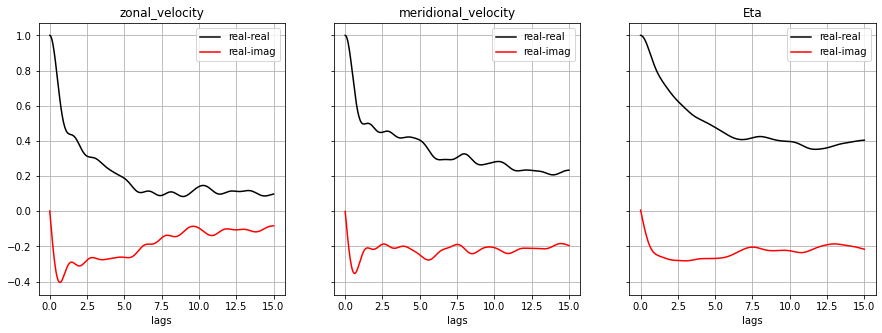

In [36]:
fig,ax = plt.subplots(1,len(V), figsize=(5*len(V),5),sharey=True)
for i,v in enumerate(V):
    (R[v][v+'_real-real'].mean(['i','j'])/R[v][v+'_real-real'].mean(['i','j']).isel(lags=0)).plot(ax=ax[i],c='k',label='real-real');
    (R[v][v+'_real-imag'].mean(['i','j'])/R[v][v+'_real-real'].mean(['i','j']).isel(lags=0)).plot(ax=ax[i],c='r',label='real-imag');
    ax[i].grid();ax[i].legend()
    ax[i].set_title(v)

In [37]:
Tlag = [40,80,160]
lags = [np.arange(0,T//2+dt,dt)[:int(T//2*1/dt)+1] for T in Tlag]
R={}
for v in V:
    _u = ds_hat[v+'_hat']
    Crr = xr.concat([wrap_correlate(np.real(_u)-np.real(_u.mean('time')), np.real(_u)-np.real(_u.mean('time')),dt,lags=lags[i],roll=True,detrend=False, Nr=int(T/dt)) for i,T in enumerate(Tlag)],dim='Tlag'
                   ).persist().assign_coords(coords={'Tlag':Tlag})
    Cri = xr.concat([wrap_correlate(np.real(_u)-np.real(_u.mean('time')), np.imag(_u)-np.imag(_u.mean('time')),dt,lags=lags[i],roll=True,detrend=False, Nr=int(T/dt)) for i,T in enumerate(Tlag)],dim='Tlag'
                   ).persist().assign_coords(coords={'Tlag':Tlag})
    R[v] = xr.merge([Crr.rename(v+'_real-real'),Cri.rename(v+'_real-imag')])

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in cdouble_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  C = xr.apply_ufunc(correlate_E, v1, v2,
<ipython-input-16-ac02ba5bbbb9>:14: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` param

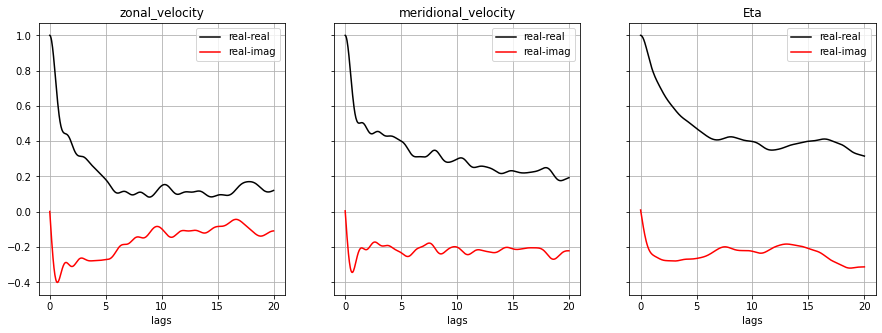

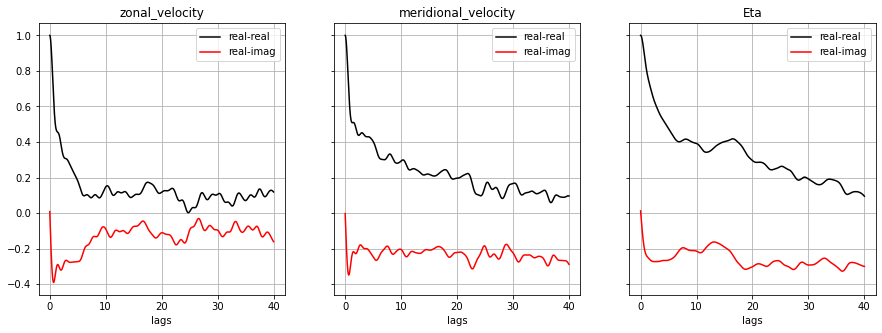

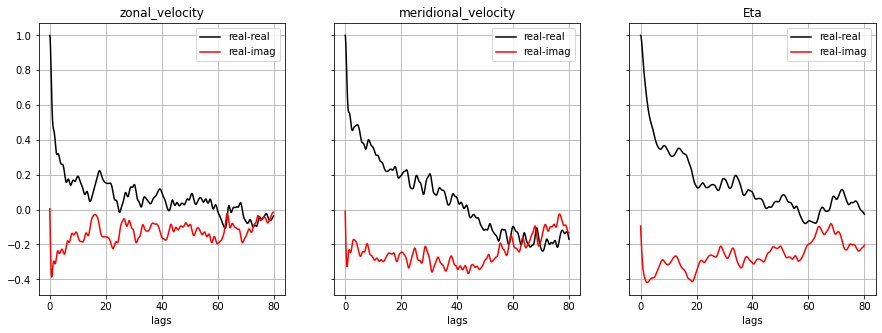

In [38]:
for T in Tlag:
    fig,ax = plt.subplots(1,len(V), figsize=(5*len(V),5),sharey=True)
    for i,v in enumerate(V):
        (R[v][v+'_real-real'].mean(['i','j'])/R[v][v+'_real-real'].mean(['i','j']).isel(lags=0)).sel(Tlag=T).plot(ax=ax[i],c='k',label='real-real');
        (R[v][v+'_real-imag'].mean(['i','j'])/R[v][v+'_real-real'].mean(['i','j']).isel(lags=0)).sel(Tlag=T).plot(ax=ax[i],c='r',label='real-imag');
        ax[i].grid();ax[i].legend()
        ax[i].set_title(v)

In [59]:
cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError
